In [1]:
import keras
from keras.models import load_model, model_from_json

Using TensorFlow backend.


In [2]:
import tensorflow as tf

def multinomial_nll(true_counts, logits):
    """Compute the multinomial negative log-likelihood
    Args:
      true_counts: observed count values
      logits: predicted logit values
    """
    counts_per_example = tf.reduce_sum(true_counts, axis=-1)
    dist = tf.contrib.distributions.Multinomial(total_count=counts_per_example,
                                                logits=logits)
    return -tf.reduce_sum(dist.log_prob(true_counts)) / tf.to_float(tf.shape(true_counts)[0])


class MultichannelMultinomialNLL(object):
    def __init__(self, n):
        self.__name__ = "MultichannelMultinomialNLL"
        self.n = n

    def __call__(self, true_counts, logits):
        for i in range(self.n):
            loss = multinomial_nll(true_counts[..., i], logits[..., i])
            if i == 0:
                total = loss
            else:
                total += loss
        return total

    def get_config(self):
        return {"n": self.n}

from keras.utils import CustomObjectScope
from keras.models import load_model
with CustomObjectScope({'MultichannelMultinomialNLL': MultichannelMultinomialNLL}):
    keras_model = load_model("model.h5")

W0709 10:19:56.774385 140668741826368 deprecation_wrapper.py:119] From /users/avanti/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0709 10:19:56.822966 140668741826368 deprecation_wrapper.py:119] From /users/avanti/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0709 10:19:57.504911 140668741826368 deprecation_wrapper.py:119] From /users/avanti/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0709 10:19:57.505913 140668741826368 deprecation_wrapper.py:119] From /users/avanti/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:184: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto i

In [3]:
keras_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
seq (InputLayer)                (None, 1000, 4)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 1000, 64)     6464        seq[0][0]                        
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 1000, 64)     12352       conv1d_1[0][0]                   
__________________________________________________________________________________________________
add_1 (Add)                     (None, 1000, 64)     0           conv1d_1[0][0]                   
                                                                 conv1d_2[0][0]                   
__________

In [4]:
def get_out_tensor(inp_tensor, layer_to_copy, param_overrides={}):
    new_config = dict(layer_to_copy.get_config().items())
    for param_name in param_overrides:
        assert param_name in new_config
        new_config[param_name] = param_overrides[param_name]
    new_layer = layer_to_copy.__class__.from_config(new_config)
    adjusted_input_shape = list(layer_to_copy.input_shape)
    assert len(adjusted_input_shape)==3
    adjusted_input_shape[1] = None #flexible input len for convs
    adjusted_input_shape = tuple(adjusted_input_shape)
    new_layer.build(adjusted_input_shape)
    new_layer.set_weights(layer_to_copy.get_weights())
    out_tensor = new_layer(inp_tensor)
    return out_tensor

In [5]:
inp_tensor = keras.layers.Input((None,4))

conv1_out = get_out_tensor(inp_tensor=inp_tensor,
                           layer_to_copy=keras_model.layers[1],
                           param_overrides={'padding': 'same'})
conv2_out = get_out_tensor(inp_tensor=conv1_out,
                           layer_to_copy=keras_model.layers[2],
                           param_overrides={'padding': 'same'})
add_out = keras.layers.Add()([conv1_out, conv2_out])

convs = [conv1_out, conv2_out]

for i in range(8):
    conv_out = get_out_tensor(inp_tensor=add_out,
                              layer_to_copy=keras_model.layers[4 + 2*i],
                              param_overrides={'padding': 'same'})
    convs.append(conv_out)
    add_out = keras.layers.Add()([add_out, conv_out])

gaps = [keras.layers.GlobalAveragePooling1D()(x) for x in convs]

#conv3_out =  get_out_tensor(inp_tensor=add1_out,
#                            layer_to_copy=keras_model.layers[4],
#                            param_overrides={'padding': 'same'})
#add2_out = keras.layers.Add()([add1_out, conv3_out])
#conv4_out =  get_out_tensor(inp_tensor=add2_out,
#                            layer_to_copy=keras_model.layers[6],
#                            param_overrides={'padding': 'same'})
#add3_out = keras.layers.Add()([add2_out, conv4_out])
#conv5_out =  get_out_tensor(inp_tensor=add3_out,
#                            layer_to_copy=keras_model.layers[8],
#                            param_overrides={'padding': 'same'})

#conv1_gap = keras.layers.GlobalAveragePooling1D()(conv1_out)
#conv2_gap = keras.layers.GlobalAveragePooling1D()(conv2_out)
#conv3_gap = keras.layers.GlobalAveragePooling1D()(conv3_out)
#conv4_gap = keras.layers.GlobalAveragePooling1D()(conv4_out)

concat = keras.layers.Concatenate(axis=-1)(gaps)
embedding_model = keras.models.Model(inputs=inp_tensor, outputs=concat)

In [6]:
embedding_model.save("embedding_model.h5")

In [7]:
import numpy as np
embedding_model.predict(np.random.random((10, 41, 4))).shape

(10, 640)

In [8]:
embedding_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, 4)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, None, 64)     6464        input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, None, 64)     12352       conv1d_1[0][0]                   
__________________________________________________________________________________________________
add_1 (Add)                     (None, None, 64)     0           conv1d_1[0][0]                   
                                                                 conv1d_2[0][0]                   
__________

In [9]:
import numpy as np
import h5py

f = h5py.File("/oak/stanford/groups/akundaje/avsec/basepair/data/"
              +"processed/comparison/output/nexus,peaks,OSNK,0,10"
              +",1,FALSE,same,0.5,64,25,0.004,9,FALSE,[1,50],TRUE"
              +",FALSE,1/deeplift.imp_score.h5", "r")
#f = h5py.File("/users/avanti/deeplift.imp_score.h5","r")
nanog_mask = np.array(f['metadata']['interval_from_task'][:]=='Nanog')
nanog_profile_wn_hypimp = np.array(f["hyp_imp/Nanog/profile/wn"][:])[nanog_mask]
onehot_seq = np.array(f["inputs/seq"][:])[nanog_mask]
nanog_profile_wn_contribs = nanog_profile_wn_hypimp*onehot_seq

In [10]:
nanog_profile_wn_contribs.shape

(55233, 1000, 4)

In [11]:
#print modisco commit hash
%cd /users/avanti/tfmodisco
!git log -n 1
%cd /users/avanti/tfmodisco_bio_experiments/bpnet/trial1

from importlib import reload

/mnt/lab_data2/avanti/tfmodisco
commit deb9880ff8845bfcc3657a266e1a857059b31fd7 (HEAD -> dev2, origin/dev2)
Author: AvantiShri <avanti.shrikumar@gmail.com>
Date:   Fri Jun 19 11:26:57 2020 -0700

    support for sparse return
/mnt/lab_data2/avanti/tfmodisco_bio_experiments/bpnet/trial1


In [12]:
%matplotlib inline
import h5py
import numpy as np
import modisco
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.phenograph
reload(modisco.cluster.phenograph)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.cluster
reload(modisco.cluster)
import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.affinitymat.transformers
reload(modisco.affinitymat.transformers)
import modisco.tfmodisco_workflow.seqlets_to_patterns
reload(modisco.tfmodisco_workflow.seqlets_to_patterns)
import modisco.tfmodisco_workflow.workflow
reload(modisco.tfmodisco_workflow.workflow)
import modisco.nearest_neighbors
reload(modisco.nearest_neighbors)
import modisco.affinitymat
reload(modisco.affinitymat)
import modisco.aggregator
reload(modisco.aggregator)
import modisco.value_provider
reload(modisco.value_provider)
import modisco.core
reload(modisco.core)
import modisco.coordproducers
reload(modisco.coordproducers)
import modisco.metaclusterers
reload(modisco.metaclusterers)
import modisco.clusterinit.memeinit
reload(modisco.clusterinit.memeinit)

%matplotlib inline

TF-MoDISco is using the TensorFlow backend.


num seqs to use: 1104
On task Nanog_profile_wn
Computing windowed sums on original
Generating null dist
peak(mu)= 0.003840833756548818
Computing threshold
Thresholds from null dist were -0.0166471004486084  and  0.10157325863838196
Final raw thresholds are -0.0166471004486084  and  0.10157325863838196
Final transformed thresholds are -0.519914596273292  and  0.8223334442472642


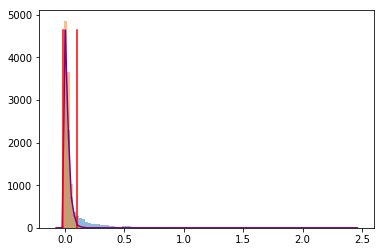

Got 9356 coords
After resolving overlaps, got 9356 seqlets
Across all tasks, the weakest transformed threshold used was: 0.519814596273292
MEMORY 3.324100608
9356 identified in total
Reducing weak_threshold_for_counting_sign to match weakest_transformed_thresh, from 0.8 to 0.519814596273292
2 activity patterns with support >= 100 out of 2 possible patterns
Metacluster sizes:  [8719, 637]
Idx to activities:  {0: '1', 1: '-1'}
MEMORY 3.324547072


In [13]:
import modisco
from collections import OrderedDict
import sys


def print_memory_use():
    import os
    import psutil
    process = psutil.Process(os.getpid())
    print("MEMORY",process.memory_info().rss/1000000000)

FRAC_SEQS_TO_USE = 0.02
NUM_SEQS_TO_USE = int(FRAC_SEQS_TO_USE*len(nanog_profile_wn_contribs))
print("num seqs to use:", NUM_SEQS_TO_USE)

task_names=["Nanog_profile_wn"]
contrib_scores={'Nanog_profile_wn':
                 nanog_profile_wn_contribs[:NUM_SEQS_TO_USE]}
hypothetical_contribs={'Nanog_profile_wn':
                       nanog_profile_wn_hypimp[:NUM_SEQS_TO_USE]}
one_hot=onehot_seq[:NUM_SEQS_TO_USE]
#null_tracks should either be a dictionary
# from task_name to 1d trakcs, or a callable
null_per_pos_scores = modisco.coordproducers.LaplaceNullDist(
    num_to_samp=10000)
revcomp = True
plot_save_dir = "figures"

sliding_window_size = 21
flank_size = 10
histogram_bins = 100
percentiles_in_bandwidth = 10
overlap_portion = 0.5
min_metacluster_size = 100
min_metacluster_size_frac = 0.01
weak_threshold_for_counting_sign = 0.8
target_seqlet_fdr = 0.2
min_passing_windows_frac = 0.03
max_passing_windows_frac = 0.2
separate_pos_neg_thresholds = False
verbose = True
min_seqlets_per_task = None
other_tracks = []
#reducing from 50000 to 10000 for debugging purposes
max_seqlets_per_metacluster = 10000 #50000

overlap_resolver = modisco.core.SeqletsOverlapResolver(
    overlap_detector=modisco.core.CoordOverlapDetector(overlap_portion),
    seqlet_comparator=modisco.core.SeqletComparator(
       value_provider=
        modisco.value_provider.CoorScoreValueProvider()))

coord_producer = modisco.coordproducers.FixedWindowAroundChunks(
    sliding=sliding_window_size,
    flank=flank_size,
    suppress=(int(0.5*sliding_window_size)
              + flank_size),
    target_fdr=target_seqlet_fdr,
    min_passing_windows_frac=min_passing_windows_frac,
    max_passing_windows_frac=max_passing_windows_frac,
    separate_pos_neg_thresholds=separate_pos_neg_thresholds,
    max_seqlets_total=None,
    verbose=verbose,
    plot_save_dir=plot_save_dir) 

track_set = (modisco.tfmodisco_workflow.workflow.prep_track_set(
    task_names=task_names,
    contrib_scores=contrib_scores,
    hypothetical_contribs=hypothetical_contribs,
    one_hot=one_hot,
    revcomp=revcomp,
    other_tracks=other_tracks))

per_position_contrib_scores = OrderedDict([
    (x, [np.sum(s,axis=1) for s in contrib_scores[x]])
    for x in task_names])

multitask_seqlet_creation_results = modisco.core.MultiTaskSeqletCreator(
    coord_producer=coord_producer,
    overlap_resolver=overlap_resolver)(
        task_name_to_score_track=per_position_contrib_scores,
        null_tracks=null_per_pos_scores,
        track_set=track_set)

#find the weakest transformed threshold used across all tasks
weakest_transformed_thresh = (min(
    [min(x.tnt_results.transformed_pos_threshold,
         abs(x.tnt_results.transformed_neg_threshold))
         for x in (multitask_seqlet_creation_results.
                   task_name_to_coord_producer_results.values())]) -
    0.0001) #subtract 1e-4 to avoid weird numerical issues
print("Across all tasks, the weakest transformed threshold used"
      +" was: "+str(weakest_transformed_thresh))
print_memory_use()

all_seqlets = multitask_seqlet_creation_results.final_seqlets
print(str(len(all_seqlets))+" identified in total")
if (len(all_seqlets) < 100):
    print("WARNING: you found relatively few seqlets."
          +" Consider dropping target_seqlet_fdr") 

if int(min_metacluster_size_frac * len(all_seqlets)) > min_metacluster_size:
    print("min_metacluster_size_frac * len(seqlets) = {0} is more than min_metacluster_size={1}.".\
          format(int(min_metacluster_size_frac * len(all_seqlets)), min_metacluster_size))
    print("Using it as a new min_metacluster_size")
    min_metacluster_size = int(min_metacluster_size_frac * len(all_seqlets))

weak_threshold_for_counting_sign=0.8
if (weak_threshold_for_counting_sign is None):
    weak_threshold_for_counting_sign = weakest_transformed_thresh
else:
    weak_threshold_for_counting_sign =\
        weak_threshold_for_counting_sign
    
if (weak_threshold_for_counting_sign > weakest_transformed_thresh):
    print("Reducing weak_threshold_for_counting_sign to"
          +" match weakest_transformed_thresh, from "
          +str(weak_threshold_for_counting_sign)
          +" to "+str(weakest_transformed_thresh))
    weak_threshold_for_counting_sign = weakest_transformed_thresh

task_name_to_value_provider = OrderedDict([
    (task_name,
     modisco.value_provider.TransformCentralWindowValueProvider(
        track_name=task_name+"_contrib_scores",
        central_window=sliding_window_size,
        val_transformer= 
         coord_producer_results.tnt_results.val_transformer))
     for (task_name,coord_producer_results)
         in (multitask_seqlet_creation_results.
             task_name_to_coord_producer_results.items())])

min_metacluster_size=100
metaclusterer = modisco.metaclusterers.SignBasedPatternClustering(
                        min_cluster_size=min_metacluster_size,
                        task_name_to_value_provider=
                            task_name_to_value_provider,
                        task_names=task_names,
                        threshold_for_counting_sign=
                            weakest_transformed_thresh,
                        weak_threshold_for_counting_sign=
                            weak_threshold_for_counting_sign)

metaclustering_results = metaclusterer.fit_transform(all_seqlets)
metacluster_indices = np.array(
    metaclustering_results.metacluster_indices)
metacluster_idx_to_activity_pattern =\
    metaclustering_results.metacluster_idx_to_activity_pattern

num_metaclusters = max(metacluster_indices)+1
metacluster_sizes = [np.sum(metacluster_idx==metacluster_indices)
                      for metacluster_idx in range(num_metaclusters)]
if (verbose):
    print("Metacluster sizes: ",metacluster_sizes)
    print("Idx to activities: ",metacluster_idx_to_activity_pattern)
    print_memory_use()
    sys.stdout.flush()

In [70]:
metacluster_idx = 0
metacluster_size = metacluster_sizes[metacluster_idx]
print("On metacluster "+str(metacluster_idx))                       
if (max_seqlets_per_metacluster is None                        
    or max_seqlets_per_metacluster >= metacluster_size):       
    print("Metacluster size", metacluster_size)                     
else:                                                               
    print("Metacluster size {0} limited to {1}".format(             
            metacluster_size, max_seqlets_per_metacluster))    
sys.stdout.flush()                                                  
metacluster_activities = [                                          
    int(x) for x in                                                 
    metacluster_idx_to_activity_pattern[metacluster_idx].split(",")]
assert len(all_seqlets)==len(metacluster_indices)                       
metacluster_seqlets = [                                             
    x[0] for x in zip(all_seqlets, metacluster_indices)                 
    if x[1]==metacluster_idx][:max_seqlets_per_metacluster]    
relevant_task_names, relevant_task_signs =\
    zip(*[(x[0], x[1]) for x in                                     
        zip(task_names, metacluster_activities) if x[1] != 0])      
print('Relevant tasks: ', relevant_task_names)                      
print('Relevant signs: ', relevant_task_signs)                      
sys.stdout.flush()                                                  
if (len(relevant_task_names) == 0):                                 
    assert False, "This should not happen"                          
    sys.stdout.flush()                                              

onehot_track_name="sequence"
contrib_scores_track_names = [key+"_contrib_scores" for key in relevant_task_names]
hypothetical_contribs_track_names= [key+"_hypothetical_contribs" for key in relevant_task_names]                
track_signs=relevant_task_signs                              
other_comparison_track_names=[]



assert len(track_signs)==len(hypothetical_contribs_track_names)         
assert len(track_signs)==len(contrib_scores_track_names)                
                                                                                
seqlets_sorter = (lambda arr:                                           
                          sorted(arr,                                           
                                 key=lambda x:                                  
                                  -np.sum([np.sum(np.abs(x[track_name].fwd))    
                                     for track_name                             
                                     in contrib_scores_track_names])))

min_overlap_while_sliding = 0.7
pattern_comparison_settings =\
            modisco.affinitymat.core.PatternComparisonSettings(                         
                track_names=hypothetical_contribs_track_names                   
                            +contrib_scores_track_names                         
                            +other_comparison_track_names,                      
                track_transformer=modisco.affinitymat.L1Normalizer(),                   
                min_overlap=min_overlap_while_sliding)

#coarse_grained 1d embedder   
embedder_factory=(modisco.seqlet_embedding
                          .onehot_model_output.KerasModelOutputEmbedder
                          .get_factory(model_h5="embedding_model.h5"))
seqlets_to_1d_embedder = embedder_factory(                         
        onehot_track_name=onehot_track_name,                            
        toscore_track_names_and_signs=list(                             
        zip(hypothetical_contribs_track_names,                          
            [np.sign(x) for x in track_signs])))

#affinity matrix from embeddings                                        
coarse_affmat_computer =\
    modisco.affinitymat.core.AffmatFromSeqletEmbeddings(                        
        seqlets_to_1d_embedder=seqlets_to_1d_embedder,                  
        affinity_mat_from_1d=\
            modisco.affinitymat.core.NumpyCosineSimilarity(                     
                verbose=True,                                   
                gpu_batch_size=None),                                   
        verbose=True)                                           

affmat_from_seqlets_with_nn_pairs =\
    modisco.affinitymat.core.AffmatFromSeqletsWithNNpairs(                      
        pattern_comparison_settings=pattern_comparison_settings,        
        sim_metric_on_nn_pairs=\
            modisco.affinitymat.core.ParallelCpuCrossMetricOnNNpairs(           
                n_cores=10,                                   
                cross_metric_single_region=                             
                    modisco.affinitymat.core.CrossContinJaccardSingleRegion()))

seqlets = seqlets_sorter(metacluster_seqlets)
print("Computing coarse affmat", flush=True)
coarse_affmat = coarse_affmat_computer(seqlets)
print("Computing seqlet neighbors from coarse", flush=True)
seqlet_neighbors = (modisco.tfmodisco_workflow.seqlets_to_patterns
    .get_seqlet_neighbors_with_initcluster(       
        nearest_neighbors_to_compute=500,                         
        coarse_affmat=coarse_affmat,                                
        initclusters=None))
print("Computing fine-grained", flush=True)
affmat_from_seqlets_with_nn_pairs_argmax =\
    modisco.affinitymat.core.AffmatFromSeqletsWithNNpairs(
        pattern_comparison_settings=pattern_comparison_settings,
        sim_metric_on_nn_pairs=\
            modisco.affinitymat.core.ParallelCpuCrossMetricOnNNpairs(
                n_cores=10,
                cross_metric_single_region=
                    modisco.affinitymat.core.CrossContinJaccardSingleRegionWithArgmax()))

On metacluster 0
Metacluster size 8719
Relevant tasks:  ('Nanog_profile_wn',)
Relevant signs:  (1,)
Computing coarse affmat
Beginning embedding computation


/users/avanti/anaconda3/lib/python3.7/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Finished embedding computation in 21.66 s
Starting affinity matrix computations
Normalization computed in 0.12 s
Cosine similarity mat computed in 1.72 s
Normalization computed in 0.1 s
Cosine similarity mat computed in 1.69 s
Finished affinity matrix computations in 4.61 s
Computing seqlet neighbors from coarse
Computing fine-grained


In [72]:
from modisco.visualization import viz_sequence


def max_window_sum(ic_vals, window_size=6):
    per_pos_tot_ic = np.sum(ic_vals, axis=-1)
    cumsum = np.cumsum([0]+list(per_pos_tot_ic))
    return np.max(cumsum[window_size:] - cumsum[:-window_size])


def get_aligned_coordinates_for_premotif(sparse_nn_affmat_withargmax_row,
                                         seqlet_neighbors_row,
                                         seqlets,
                                         num_in_premotif):
    #subset to the num_in_premotif most similar
    argsort_indices = np.argsort(-sparse_nn_affmat_withargmax_row[:,0])[:num_in_premotif]
    seqlet_indices = np.array([seqlet_neighbors_row[i] for i in argsort_indices])
    isfwd = sparse_nn_affmat_withargmax_row[:,2][argsort_indices]
    #flip sign of offset if on reverse strand
    offsets = (sparse_nn_affmat_withargmax_row[:,1][argsort_indices])*(2*isfwd - 1)
    coords_to_return = []
    for seqlet_idx,offset,isfwd in zip(seqlet_indices,offsets,isfwd):
        new_coor = modisco.core.SeqletCoordinates(
            example_idx=seqlets[seqlet_idx].coor.example_idx,
            start=int(seqlets[seqlet_idx].coor.start-offset),
            end=int(seqlets[seqlet_idx].coor.end-offset),
            #flip is_revcomp according to value of isfwd
            is_revcomp=(seqlets[seqlet_idx].coor.is_revcomp==(isfwd==1.0)))
        coords_to_return.append(new_coor)
    return coords_to_return


def get_premotif_avgonehot(datatrack, **kwargs):
    coords = get_aligned_coordinates_for_premotif(**kwargs)
    to_avg = []
    for coor in coords:
        if (coor.start >= 0 and
            coor.end <= len(datatrack.fwd_tracks[coor.example_idx])):
            to_avg.append(datatrack.get_snippet(coor=coor).fwd)
    return np.mean(to_avg, axis=0)


def get_premotif_avgseqlets(track_set, **kwargs):
    coords = get_aligned_coordinates_for_premotif(**kwargs)
    premotif = modisco.core.Pattern()
    for track_name, datatrack in track_set.track_name_to_data_track.items():
        fwd_to_avg = []
        rev_to_avg = []
        for coor in coords:
            if (coor.start >= 0 and
                coor.end <= len(datatrack.fwd_tracks[coor.example_idx])):
                fwd_to_avg.append(datatrack.get_snippet(coor=coor).fwd)
                rev_to_avg.append(datatrack.get_snippet(coor=coor).rev)
        fwd = np.mean(fwd_to_avg, axis=0)
        rev = np.mean(rev_to_avg, axis=0)
        snippet = modisco.core.Snippet(fwd=fwd, rev=rev, has_pos_axis=True)
        premotif.track_name_to_snippet[track_name] = snippet
    return premotif
    
bg_freq = np.mean(onehot_seq, axis=(0,1))

round_sparse_nn_affmat_withargmax = []
round_premotif_avgseqlets = []
round_premotif_ics = []
current_seqlets = seqlets
for roundnumber in range(4): 
    print("ROUND NUMBER",roundnumber)
    sparse_nn_affmat_withargmax = affmat_from_seqlets_with_nn_pairs_argmax(
        seqlet_neighbors=seqlet_neighbors,
        seqlets=current_seqlets,
        return_sparse=True)
    round_sparse_nn_affmat_withargmax.append(sparse_nn_affmat_withargmax)

    premotif_avgseqlets = [
        get_premotif_avgseqlets(
            track_set=track_set,
            sparse_nn_affmat_withargmax_row=sparse_nn_affmat_withargmax[idx],
            seqlet_neighbors_row=seqlet_neighbors[idx],
            seqlets=seqlets, num_in_premotif=50)
        for idx in range(len(seqlets))]
    round_premotif_avgseqlets.append(premotif_avgseqlets)
    
    premotif_ics = np.array([
        max_window_sum(viz_sequence.ic_scale(
            pwm=premotif_avgseqlet["sequence"].fwd,
            background=bg_freq))
        for premotif_avgseqlet in premotif_avgseqlets])
    round_premotif_ics.append(premotif_ics)
    
    current_seqlets = premotif_avgseqlets

ROUND NUMBER 0
Launching nearest neighbors affmat calculation job
MEMORY 10.376052736
Parallel runs completed
MEMORY 10.377682944
Job completed in: 76.68 s
MEMORY 8.751501312
Launching nearest neighbors affmat calculation job
MEMORY 8.752705536
Parallel runs completed
MEMORY 8.757354496
Job completed in: 75.78 s
MEMORY 8.757354496
ROUND NUMBER 1
Launching nearest neighbors affmat calculation job
MEMORY 8.758386688
Parallel runs completed
MEMORY 8.758603776
Job completed in: 82.25 s
MEMORY 8.758603776
Launching nearest neighbors affmat calculation job
MEMORY 8.75851776
Parallel runs completed
MEMORY 8.759250944
Job completed in: 81.07 s
MEMORY 8.759250944
ROUND NUMBER 2
Launching nearest neighbors affmat calculation job
MEMORY 8.842625024
Parallel runs completed
MEMORY 8.843132928
Job completed in: 81.62 s
MEMORY 8.843808768
Launching nearest neighbors affmat calculation job
MEMORY 8.843808768
Parallel runs completed
MEMORY 8.845643776
Job completed in: 79.71 s
MEMORY 8.846327808
ROUND 

In [73]:
import scipy


def reconstitute_dense_affmat(sparse_affmat_withargmax, seqlet_neighbors):
    to_return = np.zeros((len(seqlet_neighbors), len(seqlet_neighbors)))
    for row_idx, (neighbors, affinitieswithargmax) in enumerate(zip(seqlet_neighbors, sparse_affmat_withargmax)):
        affinities = affinitieswithargmax[:,0]
        for col_idx, val in zip(neighbors, affinities):
            to_return[row_idx, col_idx] = val
    return to_return


def get_correlations(main_affmat, other_affmat):
    correlations = []
    for main_affmat_row, other_affmat_row\
        in zip(main_affmat, other_affmat):
        #compare correlation on the nonzero rows
        to_compare_mask = np.abs(main_affmat_row) > 0
        corr = scipy.stats.spearmanr(
                main_affmat_row[to_compare_mask],
                other_affmat_row[to_compare_mask])
        correlations.append(corr.correlation)
    correlations = np.array(correlations)
    return correlations

round_correlations = [get_correlations(main_affmat=reconstitute_dense_affmat(
                                    sparse_affmat_withargmax=sparse_nn_affmat_withargmax,
                                    seqlet_neighbors=seqlet_neighbors),
                                other_affmat=coarse_affmat)
                      for sparse_nn_affmat_withargmax in round_sparse_nn_affmat_withargmax]

Round idx 0
ICs:
0.23534809037733684


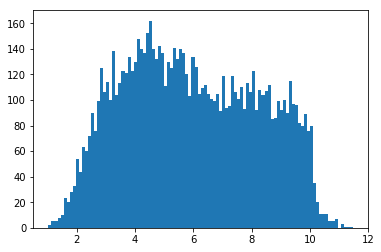

Embedding correlations:
0.12765225369881866


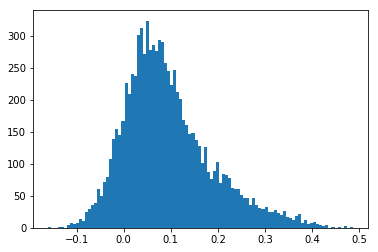

Round idx 1
ICs:
0.1234086477807088


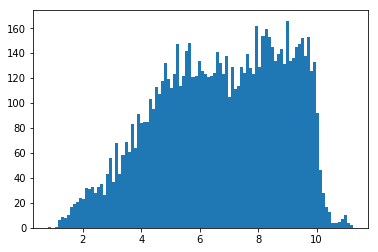

Embedding correlations:
0.12329395572886799


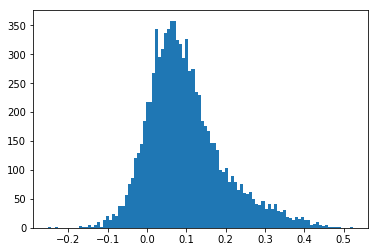

Round idx 2
ICs:
0.07546737011125129


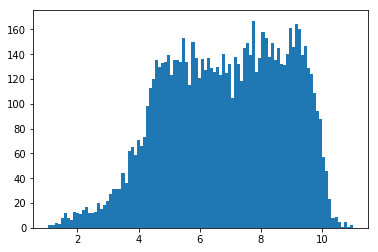

Embedding correlations:
0.1495584356004129


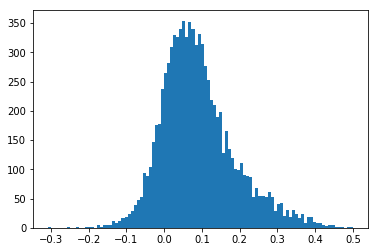

Round idx 3
ICs:
0.06216309209771763


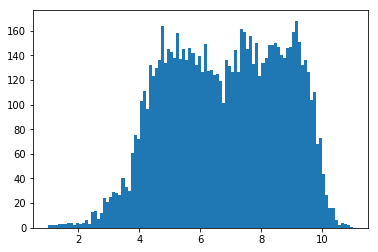

Embedding correlations:
0.15781626333295104


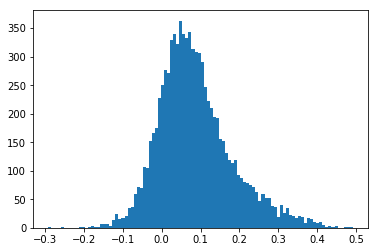

In [77]:
from matplotlib import pyplot as plt

thresh = 4

for idx,(premotif_ics,correlations) in enumerate(zip(round_premotif_ics, round_correlations)):
    print("Round idx", idx)
    print("ICs:")
    plt.hist(premotif_ics, bins=100)
    print(np.mean(premotif_ics < thresh))
    plt.show()
    print("Embedding correlations:")
    plt.hist(correlations, bins=100)
    print(np.mean(correlations < 0))
    plt.show()

#######################
FILTERING PERCENTILE: 0.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 1.0209255814552307)
Coordinate:  example:894,start:488,end:529,rc:False
Contrib scores:


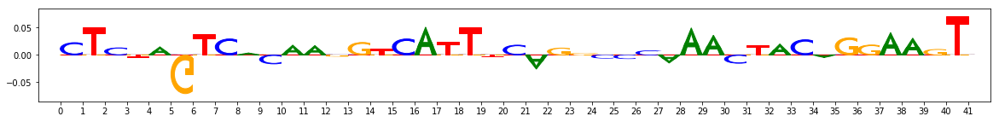

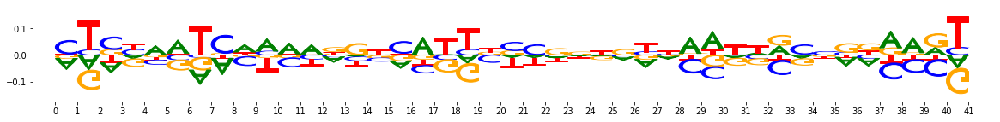

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.001614570617676


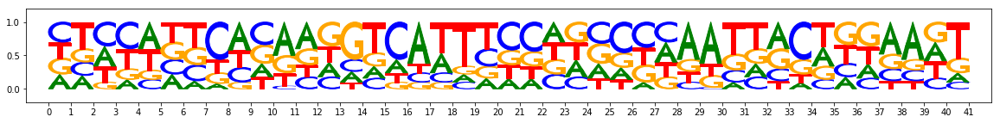

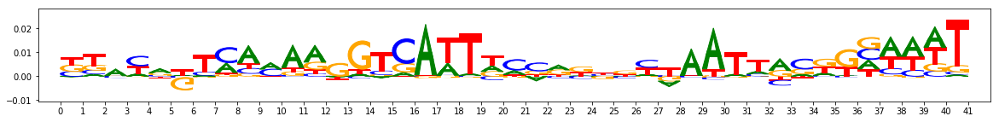

Round correlation 0.02537195235488631
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.7618269622325897


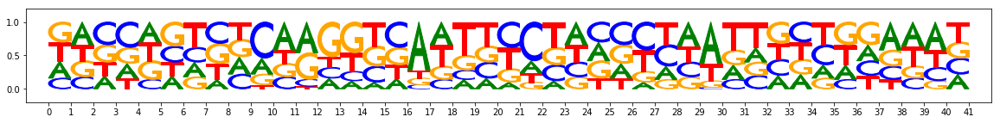

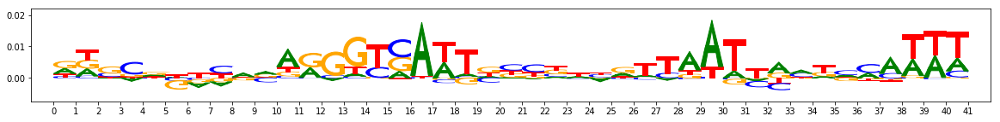

Round correlation 0.009868455503549407
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.4796080142259598


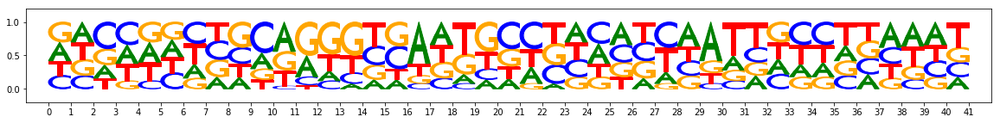

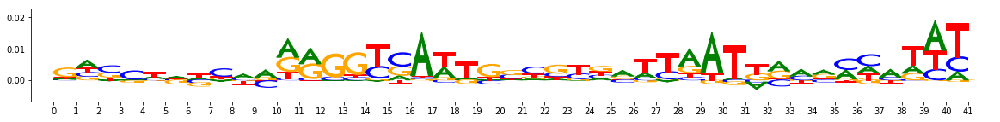

Round correlation 0.04274199522174748
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.0209255814552307


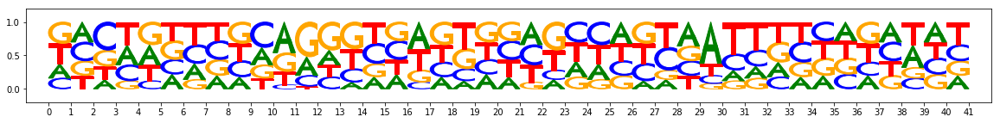

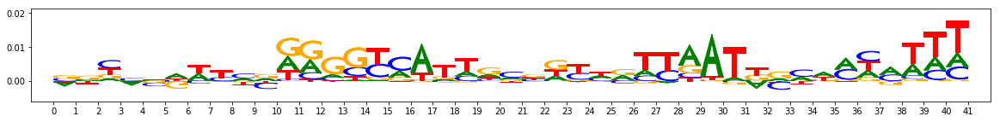

Round correlation 0.05215521771062109
#######################
FILTERING PERCENTILE: 5.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 3.8488841354846954)
Coordinate:  example:211,start:579,end:620,rc:False
Contrib scores:


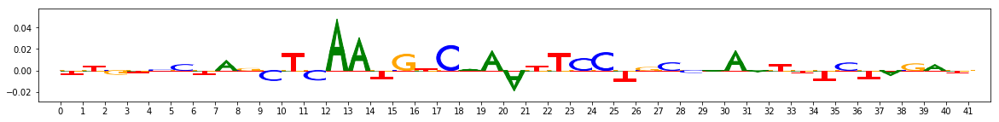

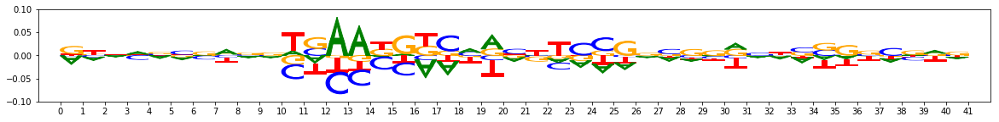

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.749600023031235


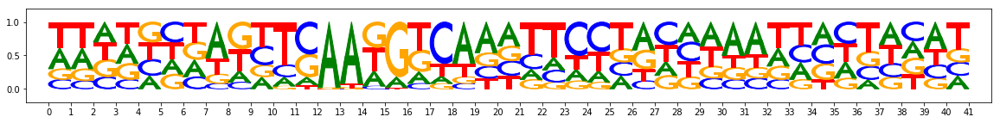

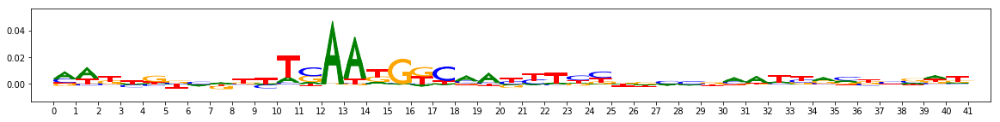

Round correlation 0.022744090052820822
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.625722914934158


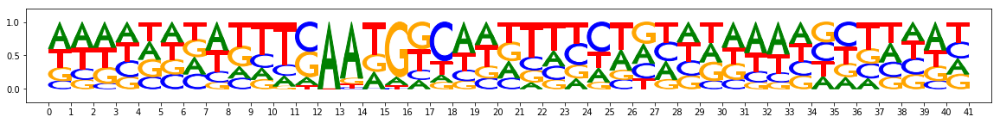

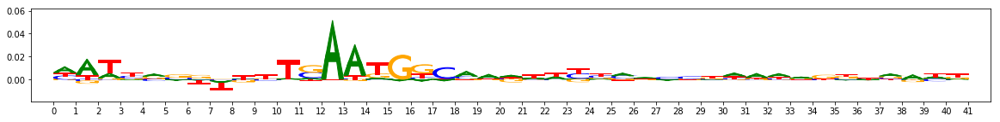

Round correlation -0.003242550832420042
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.748677596449852


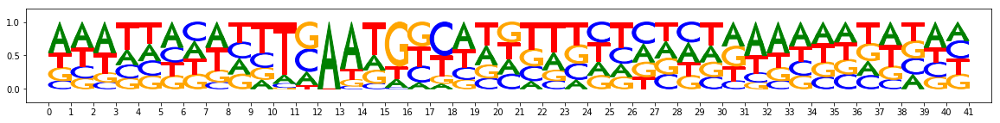

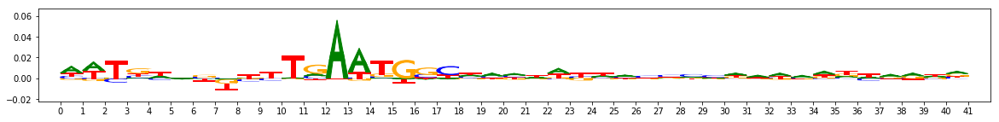

Round correlation 0.0019492807679290214
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.8488841354846954


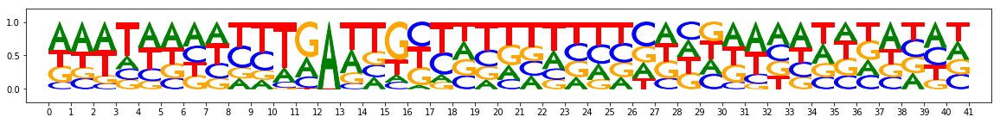

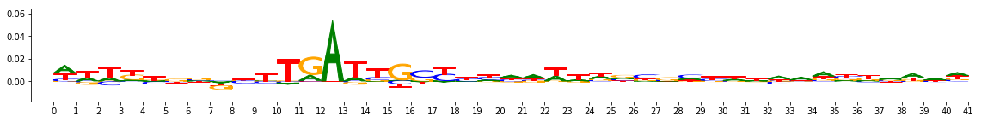

Round correlation -0.005878331127664939
#######################
FILTERING PERCENTILE: 10.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 4.3193497359752655)
Coordinate:  example:954,start:380,end:421,rc:False
Contrib scores:


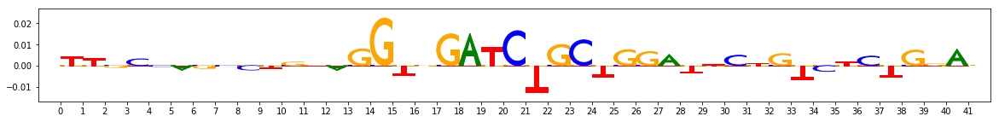

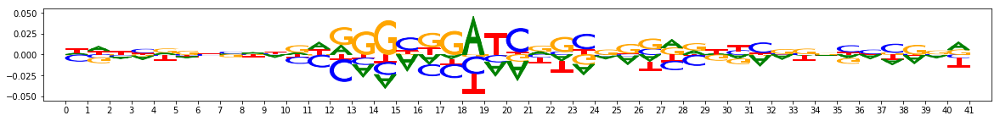

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.4021735191345215


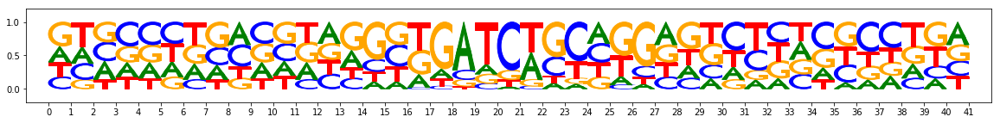

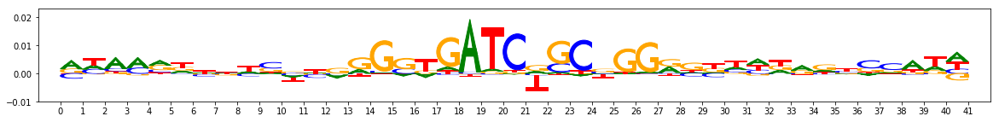

Round correlation -0.022978075721067828
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.030727118253708


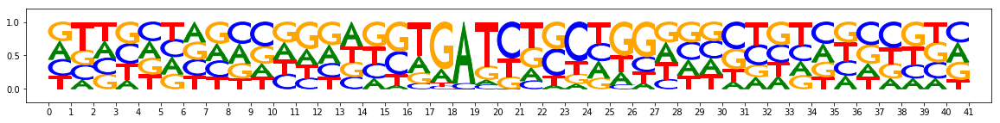

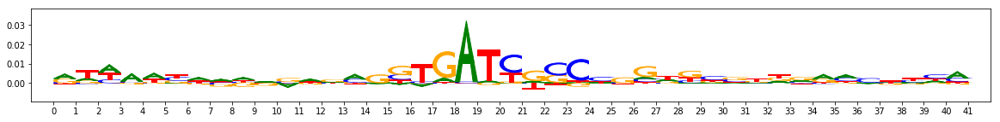

Round correlation 0.08380599756661976
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.607869789004326


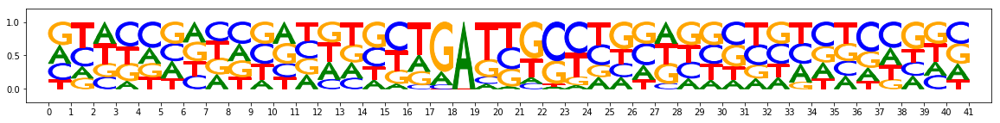

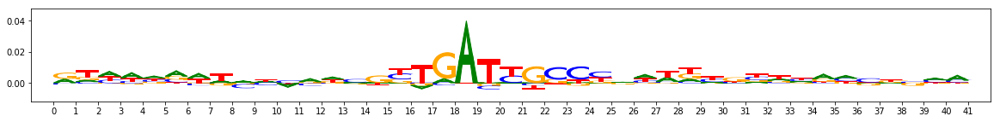

Round correlation -0.013093017152945108
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.3193497359752655


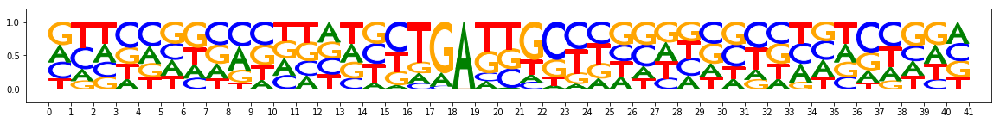

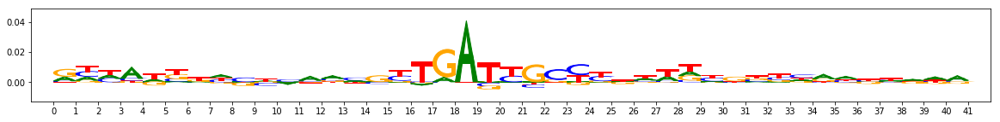

Round correlation -0.04667748169000644
#######################
FILTERING PERCENTILE: 15.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 4.646947592496872)
Coordinate:  example:993,start:369,end:410,rc:False
Contrib scores:


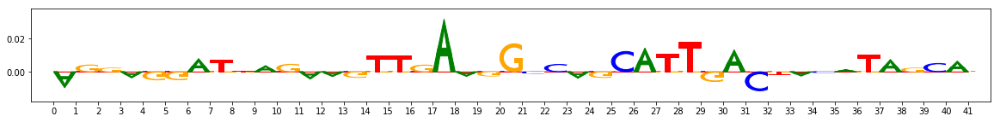

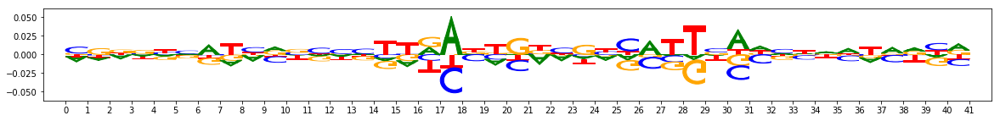

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.422796219587326


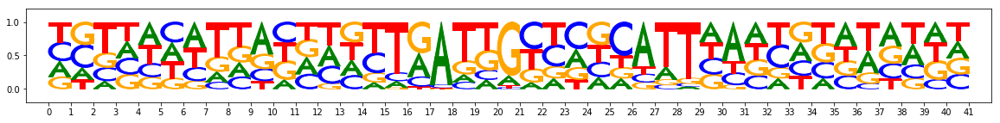

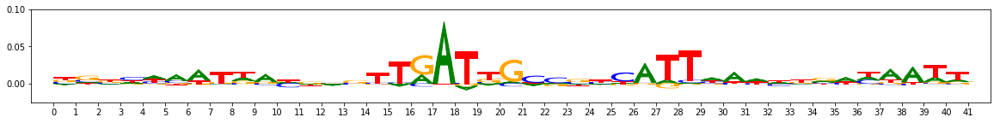

Round correlation 0.03904325679834664
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.53972715139389


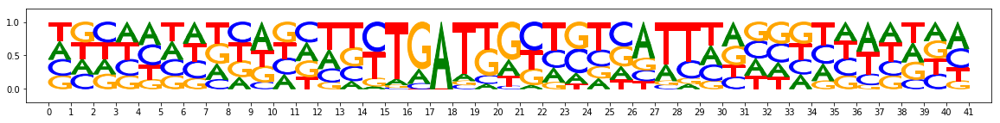

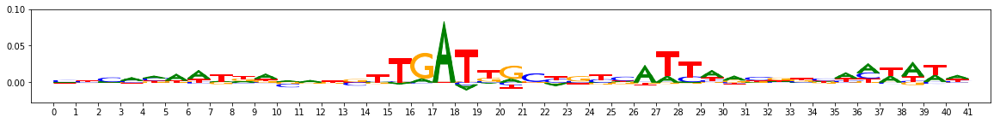

Round correlation 0.06799337595645921
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.079848259687424


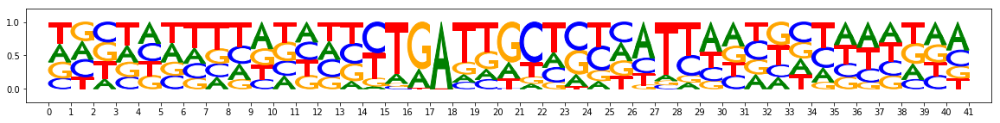

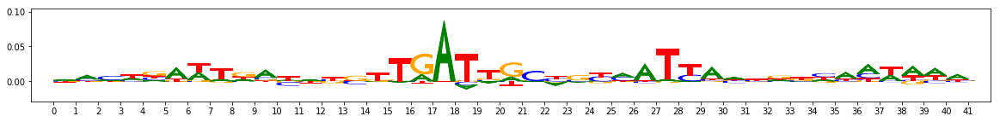

Round correlation 0.06722800620607514
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.646947592496872


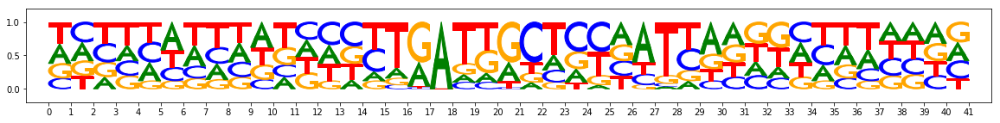

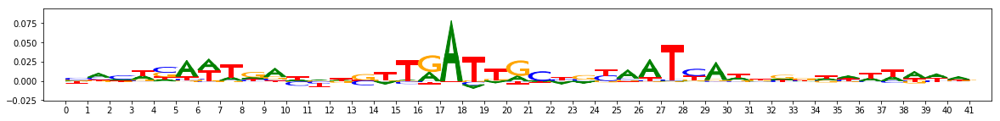

Round correlation 0.07012797553832333
#######################
FILTERING PERCENTILE: 20.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 4.945652469992638)
Coordinate:  example:536,start:373,end:414,rc:False
Contrib scores:


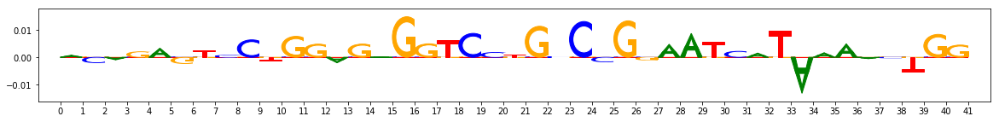

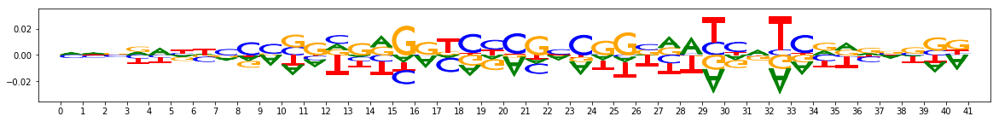

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.5509447753429413


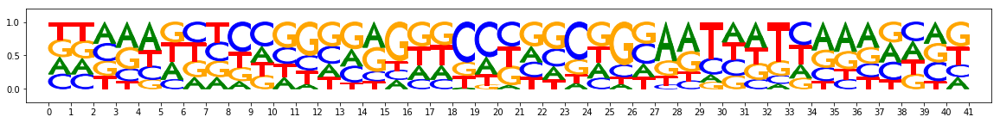

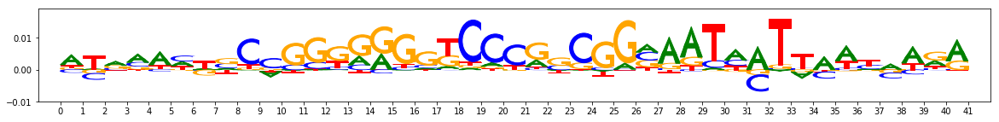

Round correlation -0.018781449950208768
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.6525513231754303


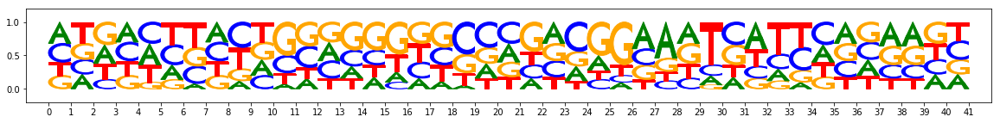

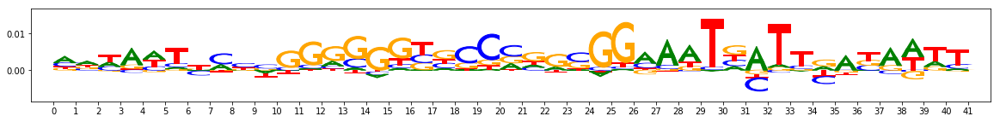

Round correlation 0.0874838412808094
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.7314911484718323


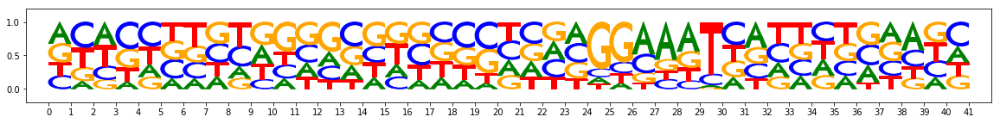

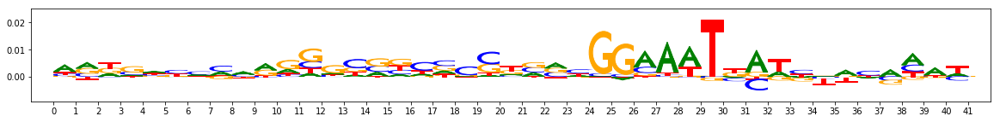

Round correlation 0.06215974722235603
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.945652469992638


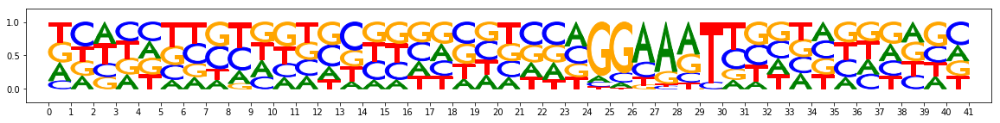

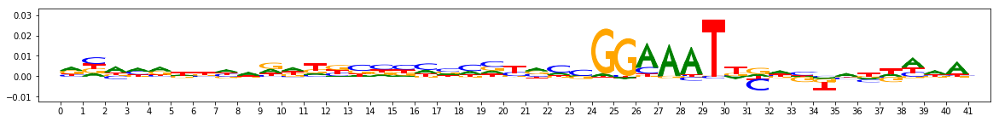

Round correlation 0.02504444616954681
#######################
FILTERING PERCENTILE: 25.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 5.252261966466904)
Coordinate:  example:395,start:481,end:522,rc:False
Contrib scores:


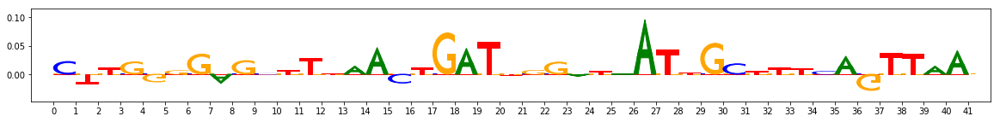

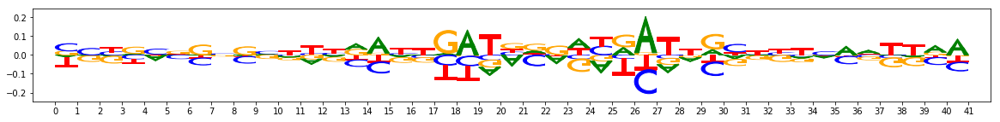

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.491472512483597


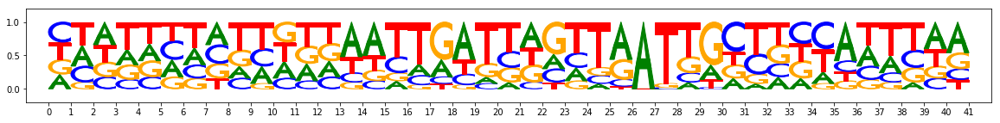

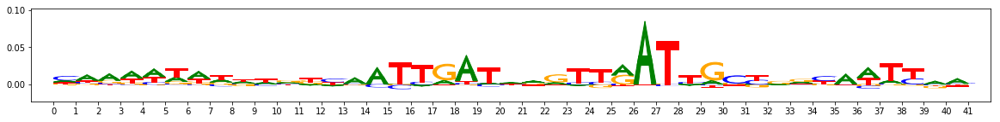

Round correlation 0.0172047153091621
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.864268571138382


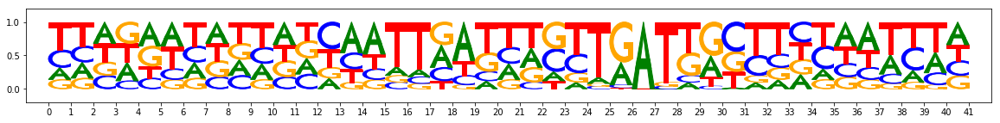

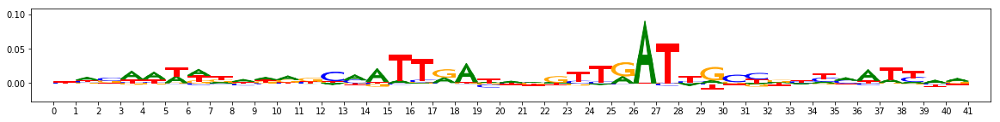

Round correlation 0.05031834699418008
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.052818924188614


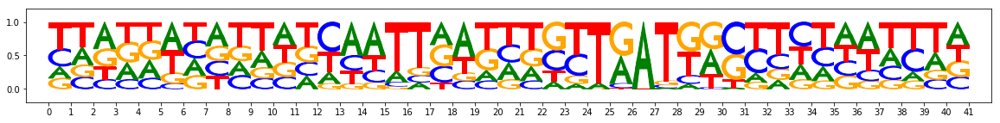

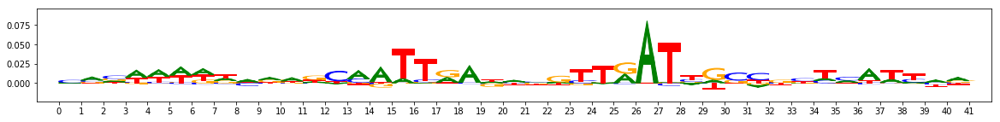

Round correlation 0.032865856301681234
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.252261966466904


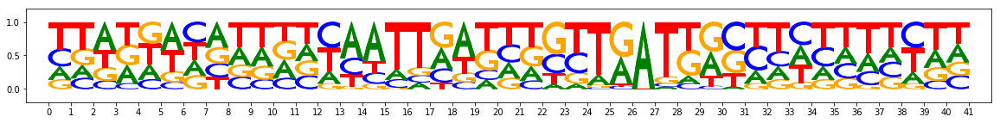

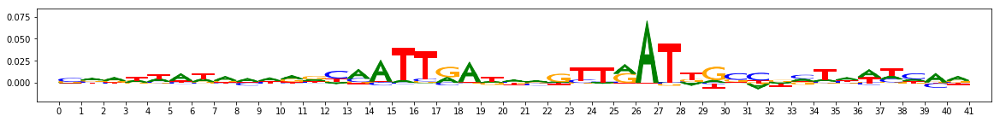

Round correlation 0.03470620760356482
#######################
FILTERING PERCENTILE: 30.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 5.553172260522842)
Coordinate:  example:565,start:623,end:664,rc:False
Contrib scores:


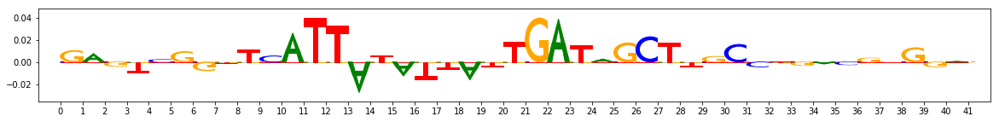

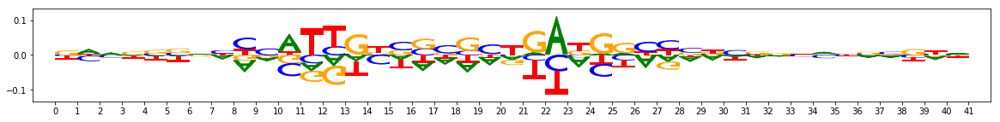

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.168439716100693


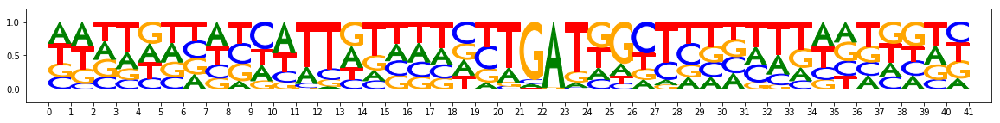

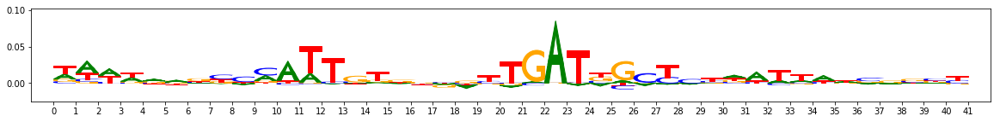

Round correlation 0.09269767106646523
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.267424911260605


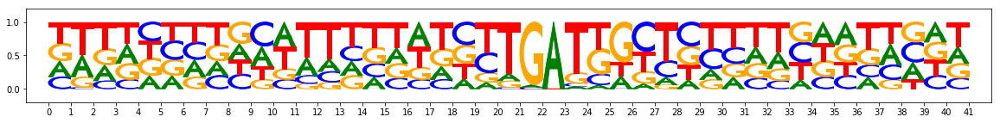

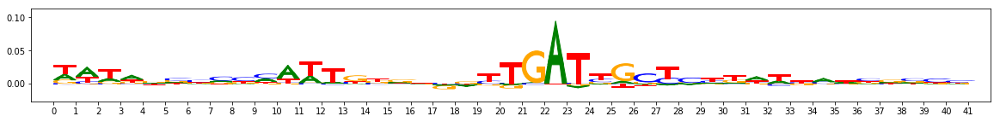

Round correlation 0.15717814899764923
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.992677450180054


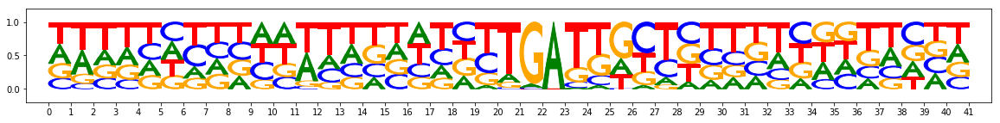

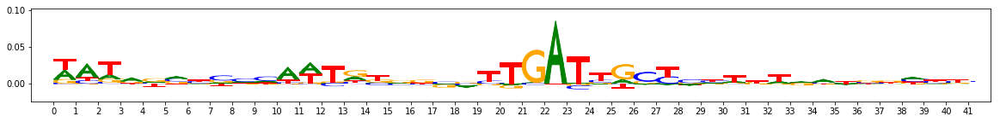

Round correlation 0.13189847545615002
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.553172260522842


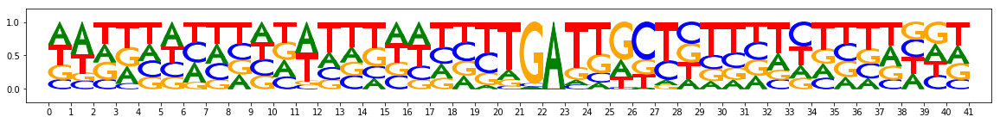

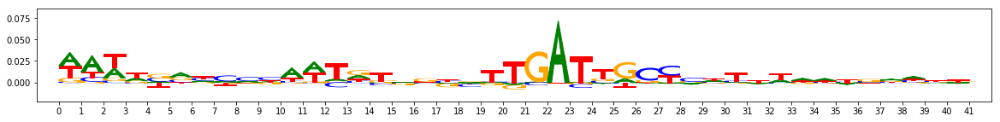

Round correlation 0.1086707141735371
#######################
FILTERING PERCENTILE: 35.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 5.856207847595215)
Coordinate:  example:422,start:567,end:608,rc:False
Contrib scores:


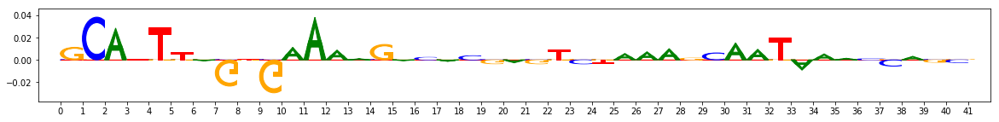

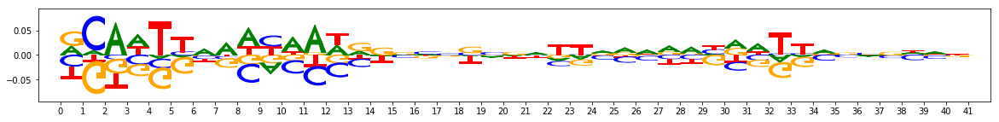

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.1225999891757965


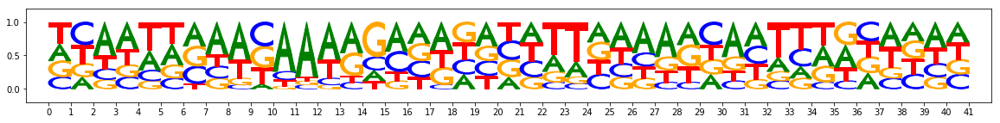

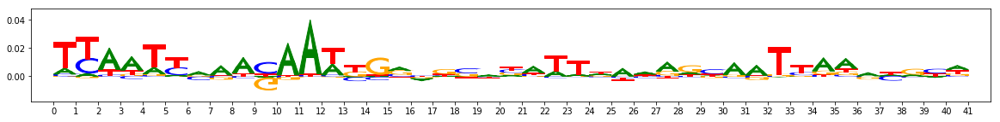

Round correlation -0.08090712984741905
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.758640289306641


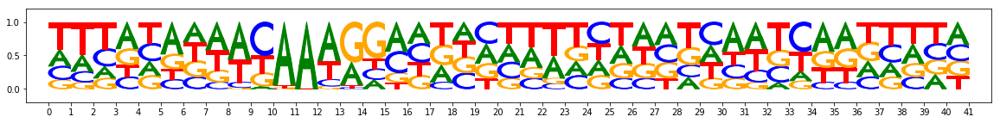

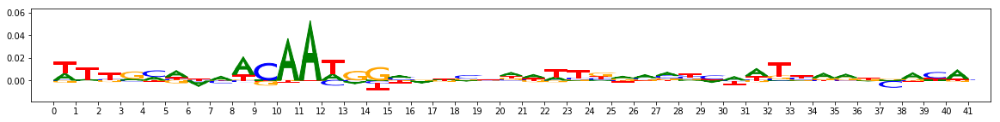

Round correlation 0.018927357345580927
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.163406401872635


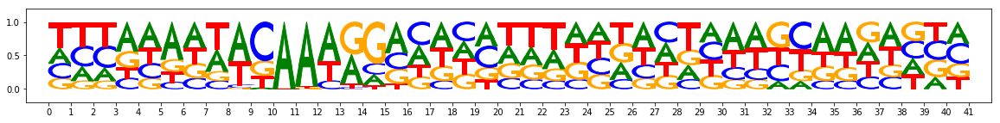

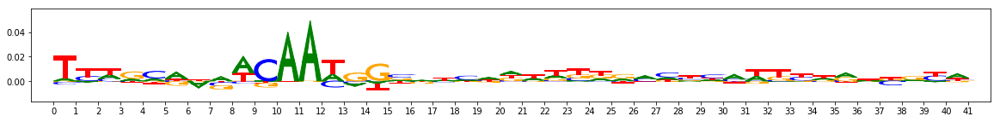

Round correlation -0.027421906501987604
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.856207847595215


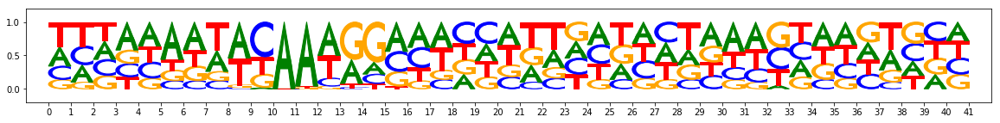

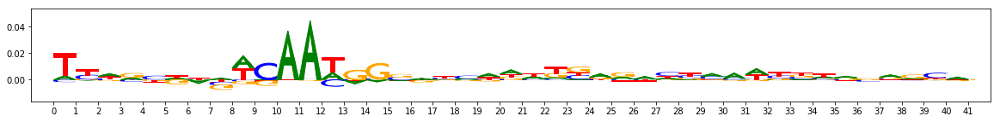

Round correlation -0.031488753082937894
#######################
FILTERING PERCENTILE: 40.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 6.1930118799209595)
Coordinate:  example:830,start:157,end:198,rc:False
Contrib scores:


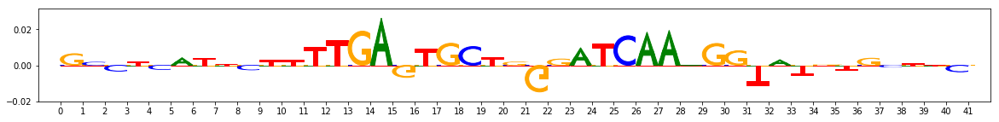

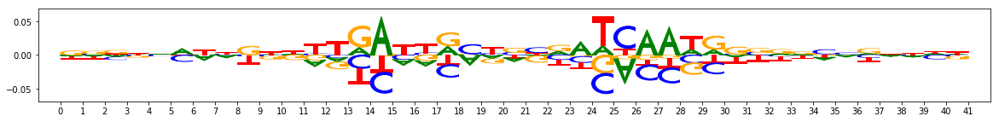

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.628381669521332


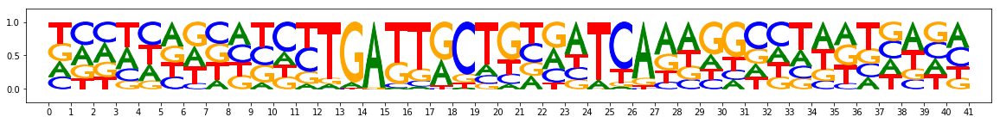

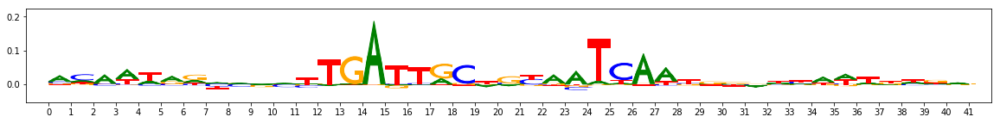

Round correlation 0.14454060591555817
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.850440055131912


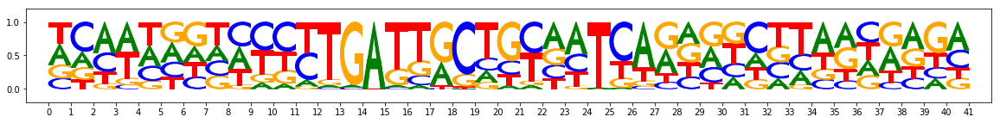

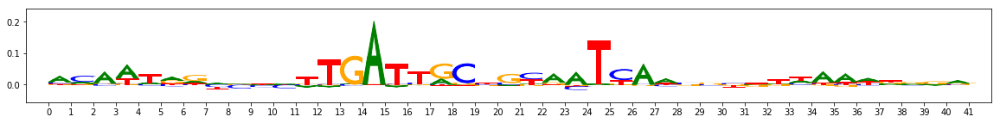

Round correlation 0.13389714282006338
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.042543947696686


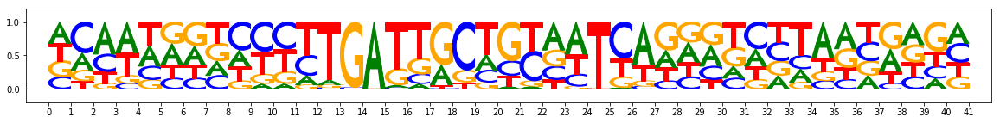

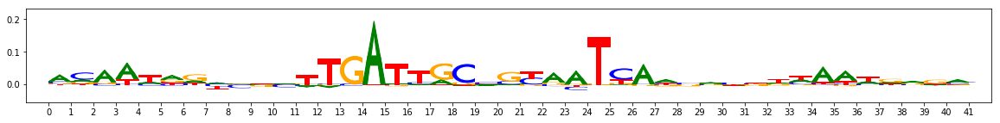

Round correlation 0.12864442862270056
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.1930118799209595


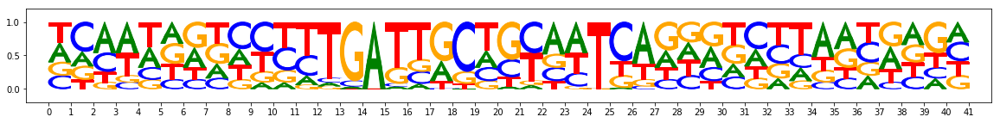

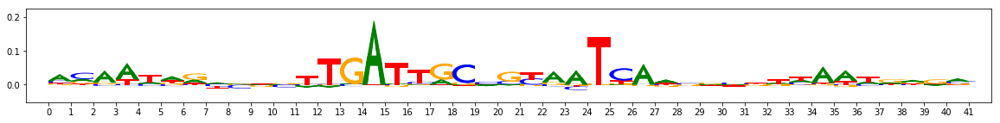

Round correlation 0.12357765332229494
#######################
FILTERING PERCENTILE: 45.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 6.527049481868744)
Coordinate:  example:142,start:432,end:473,rc:False
Contrib scores:


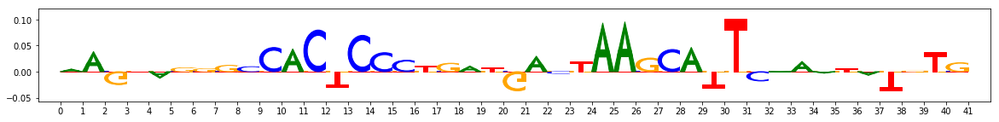

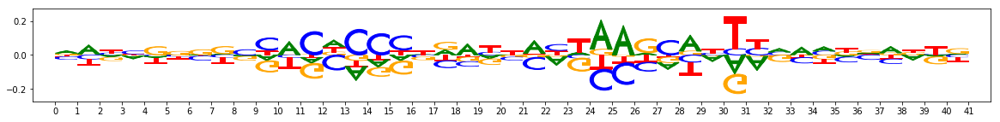

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.7274189591407776


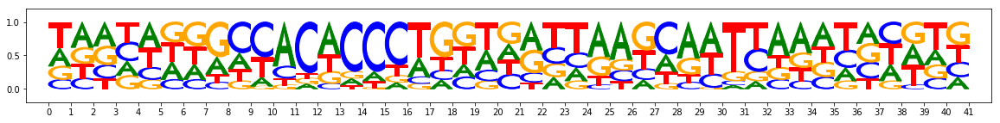

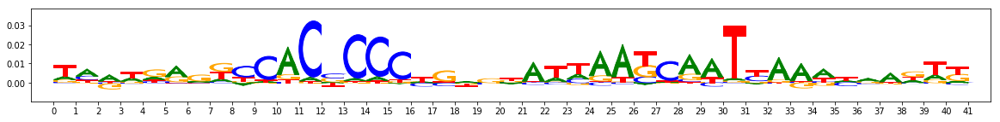

Round correlation 0.059570770808979656
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.370529979467392


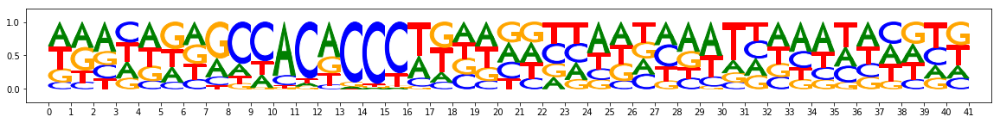

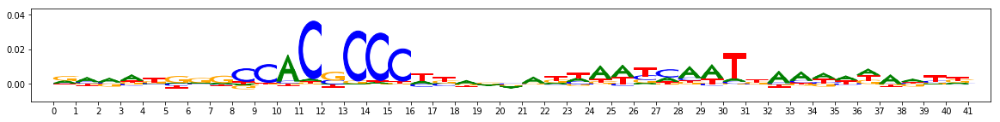

Round correlation 0.1299007085430732
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.576944649219513


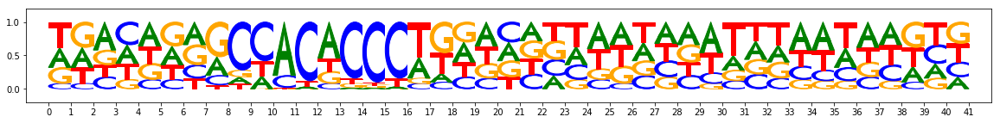

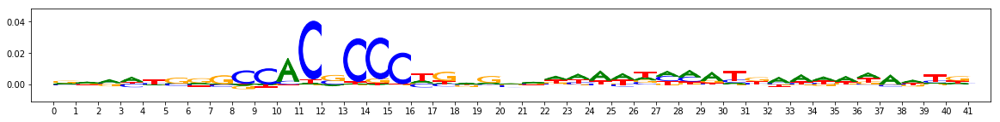

Round correlation 0.196407090202066
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.527049481868744


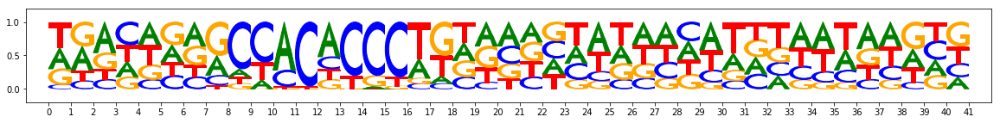

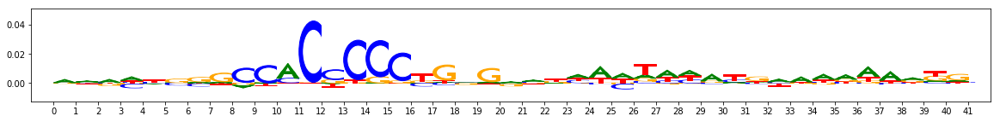

Round correlation 0.17325591048977745
#######################
FILTERING PERCENTILE: 50.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 6.88091915845871)
Coordinate:  example:205,start:453,end:494,rc:False
Contrib scores:


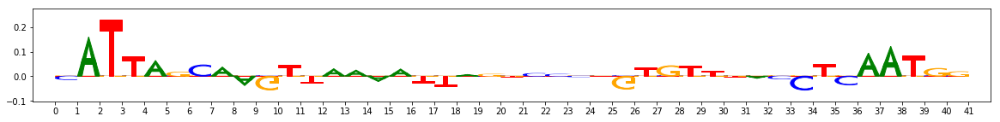

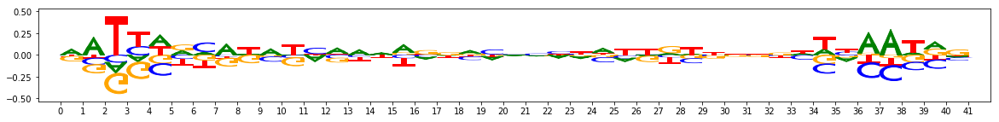

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.7597213685512543


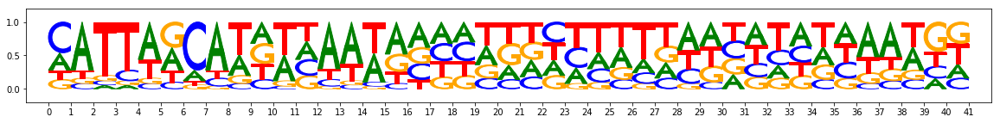

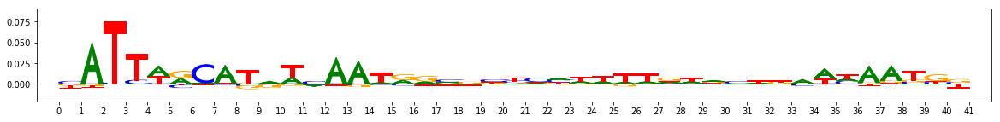

Round correlation -0.01378472037747207
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.605722397565842


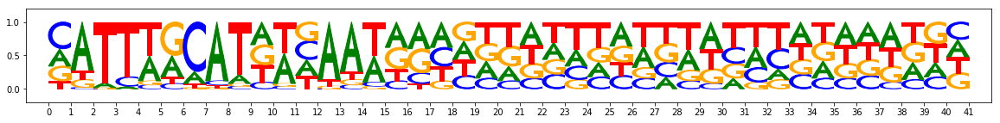

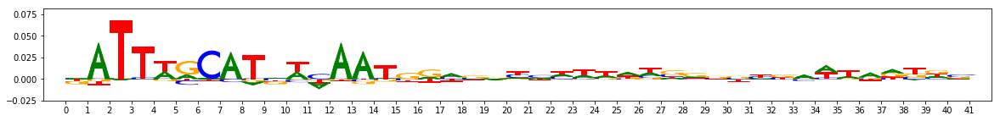

Round correlation 0.08671610246823704
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.604195296764374


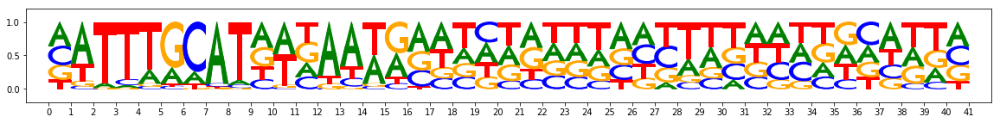

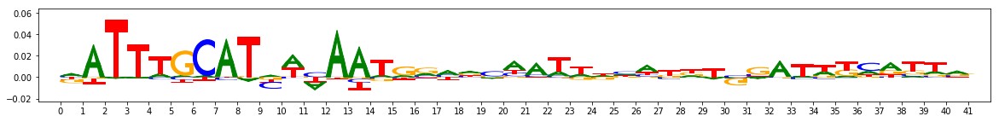

Round correlation 0.11203442804457299
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.88091915845871


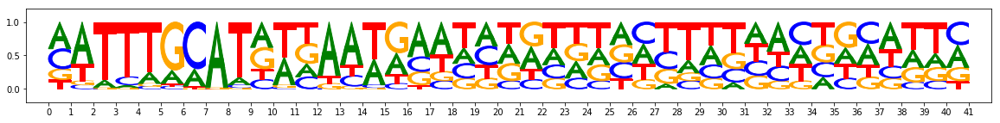

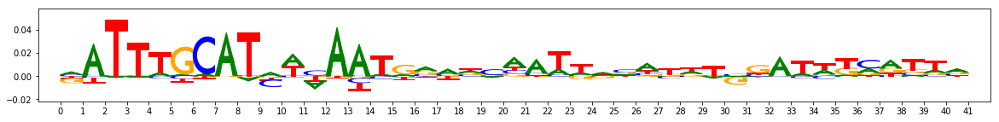

Round correlation 0.12277460762330727
#######################
FILTERING PERCENTILE: 55.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 7.2094248831272125)
Coordinate:  example:568,start:514,end:555,rc:False
Contrib scores:


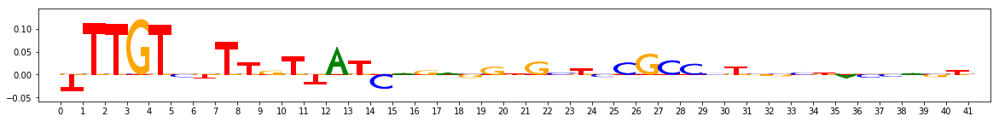

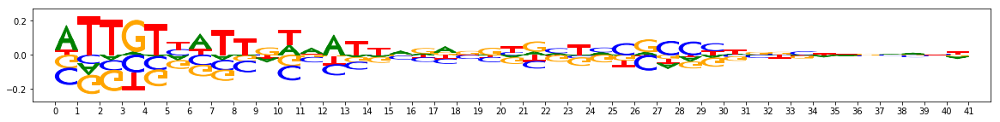

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.90100821852684


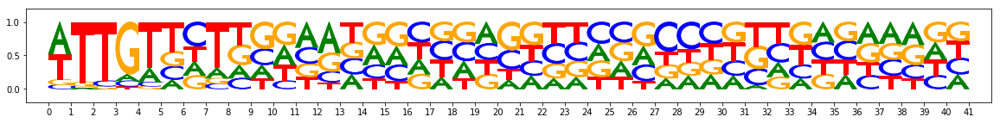

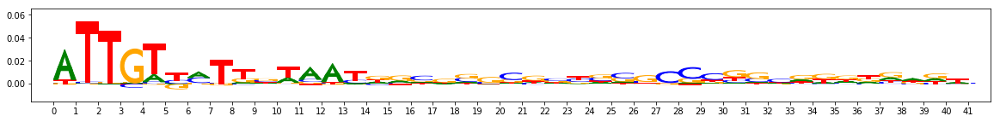

Round correlation 0.02094234042916635
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.419467777013779


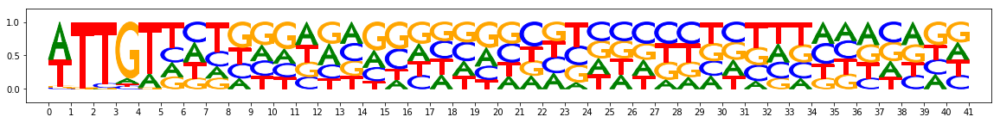

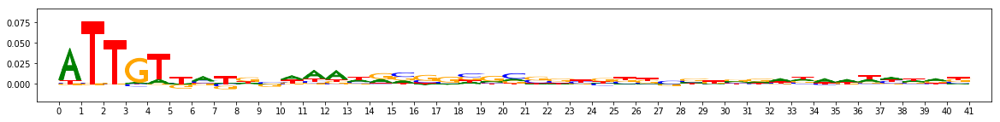

Round correlation -0.003994942767368176
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.873930513858795


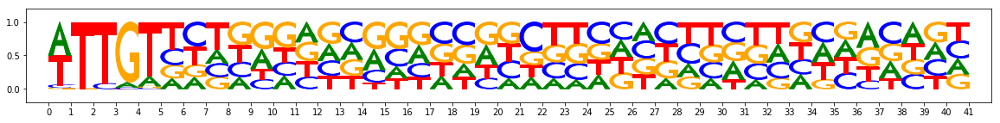

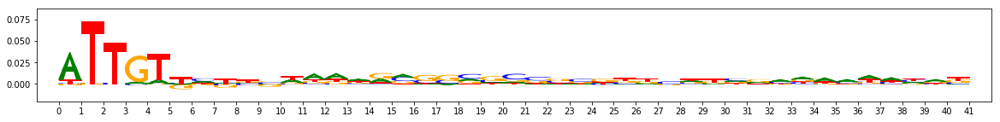

Round correlation 0.0014438535014258574
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.2094248831272125


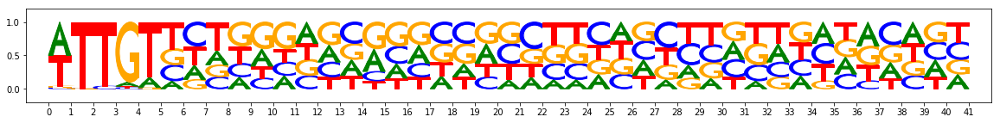

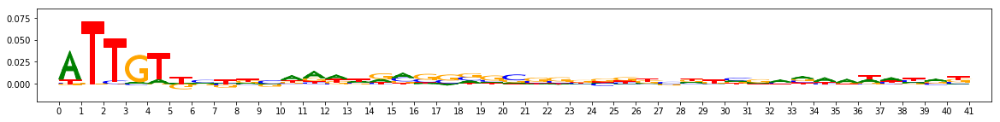

Round correlation 0.0040883180718616925
#######################
FILTERING PERCENTILE: 60.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 7.501543760299683)
Coordinate:  example:1010,start:475,end:516,rc:False
Contrib scores:


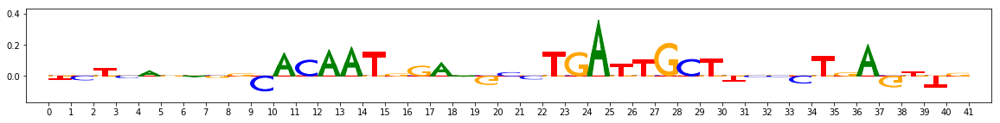

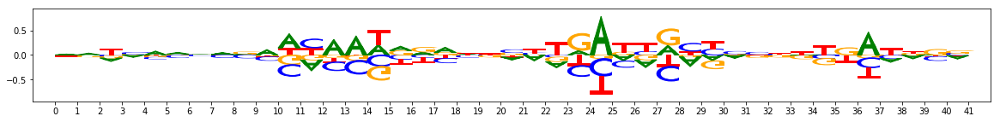

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.760864973068237


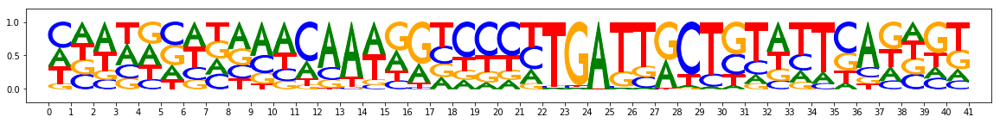

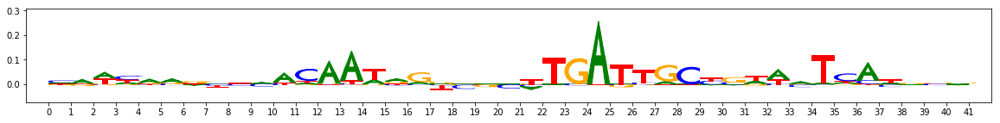

Round correlation 0.19684859111332376
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.064229309558868


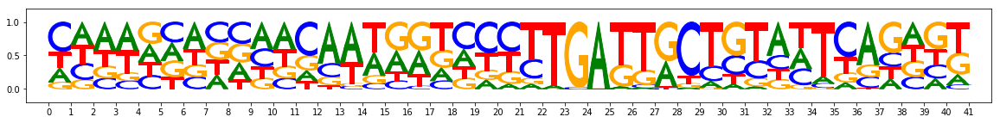

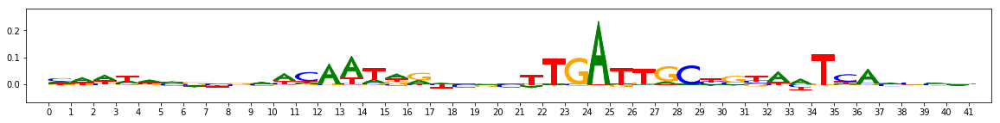

Round correlation 0.16795477576900922
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.640308678150177


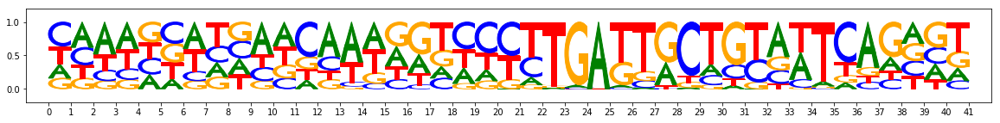

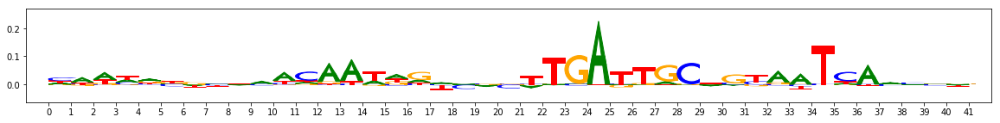

Round correlation 0.16002267147089133
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.501543760299683


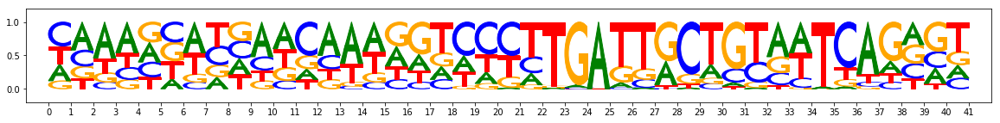

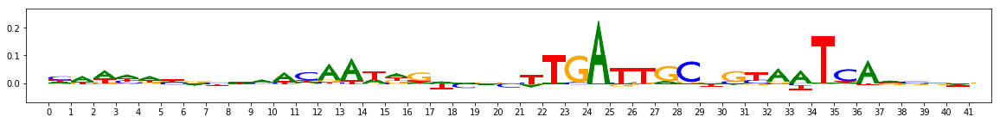

Round correlation 0.14142739897547071
#######################
FILTERING PERCENTILE: 65.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 7.801634132862091)
Coordinate:  example:132,start:379,end:420,rc:False
Contrib scores:


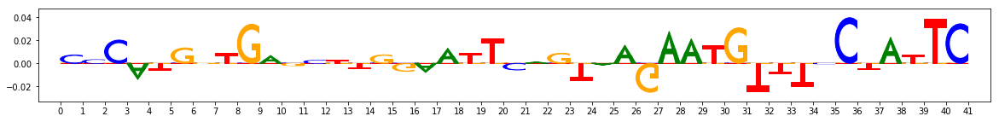

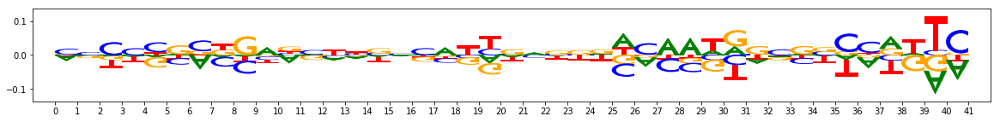

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.359388470649719


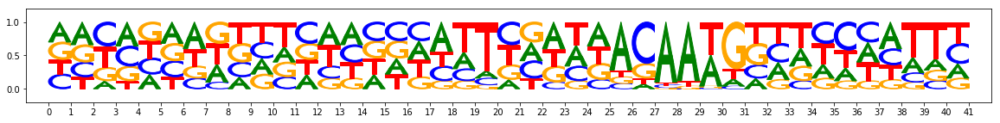

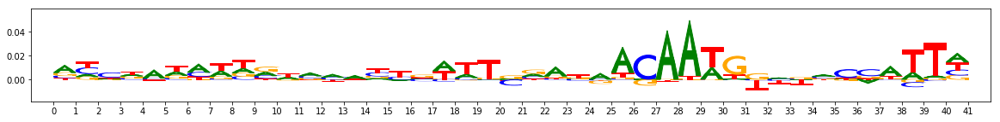

Round correlation -0.03560804172207842
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.118217170238495


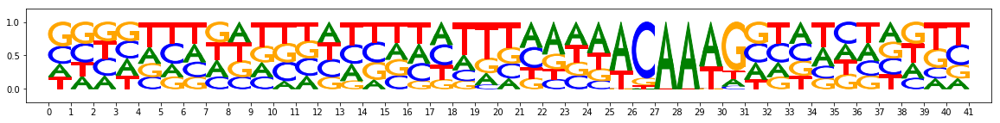

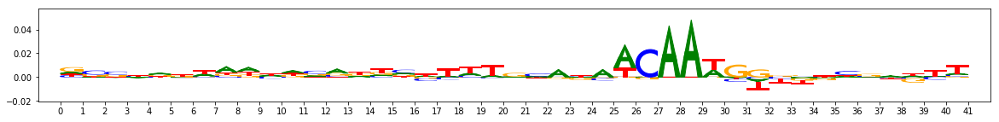

Round correlation -0.0140360739625594
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.32306969165802


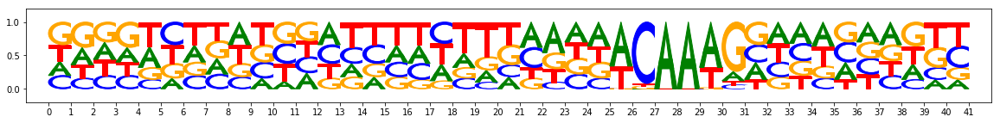

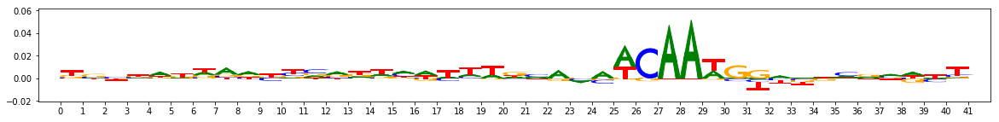

Round correlation -0.018986047472109028
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.801634132862091


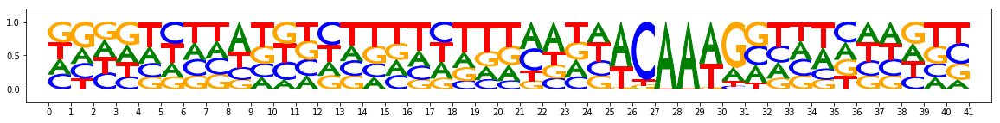

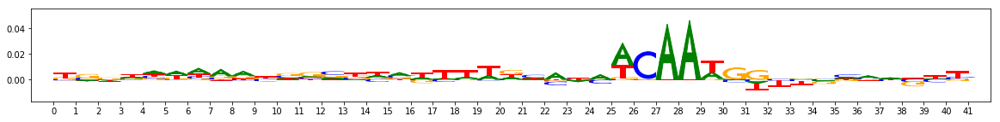

Round correlation -0.006554764234991028
#######################
FILTERING PERCENTILE: 70.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 8.122091054916382)
Coordinate:  example:939,start:476,end:517,rc:False
Contrib scores:


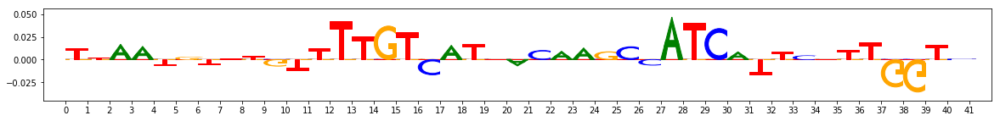

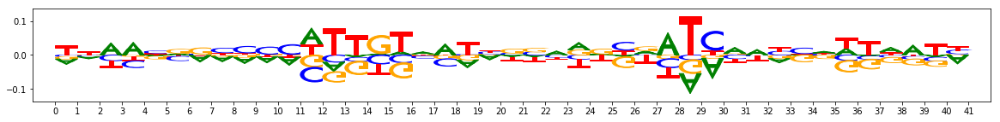

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.421760767698288


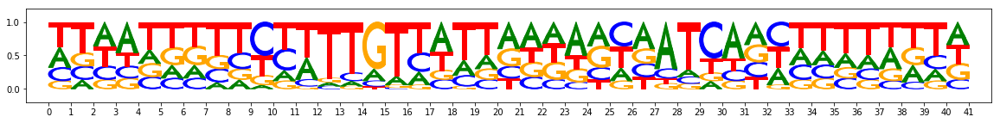

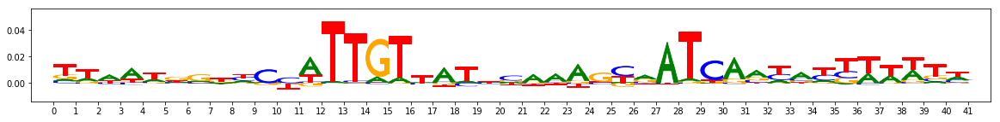

Round correlation 0.07379593357329654
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.974445044994354


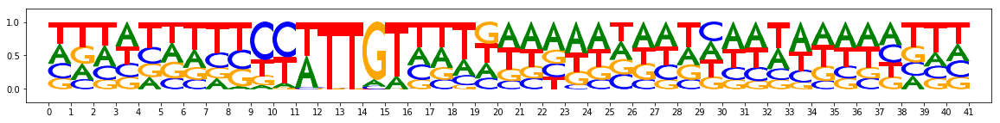

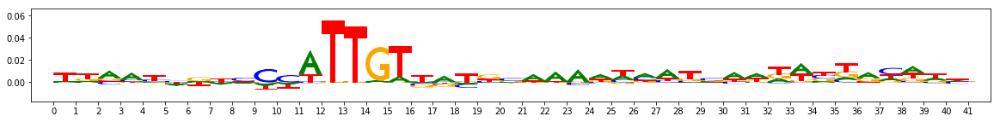

Round correlation 0.07754281449258375
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.153529405593872


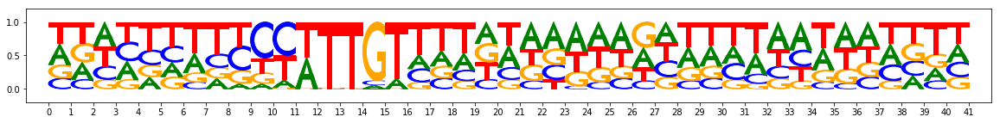

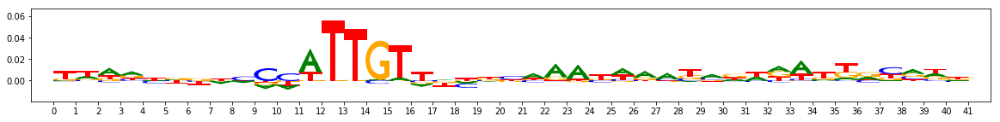

Round correlation 0.12467152347121821
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.122091054916382


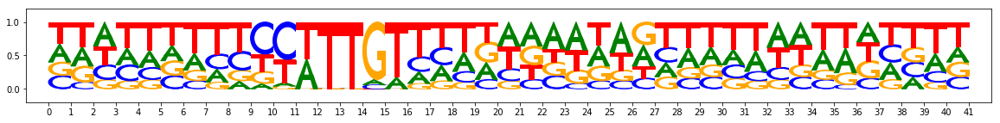

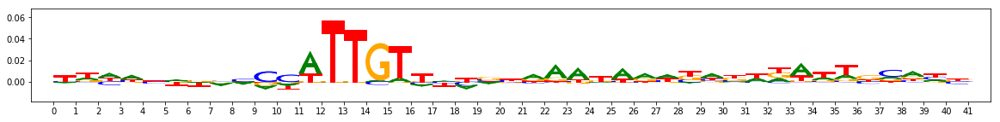

Round correlation 0.1043424436072451
#######################
FILTERING PERCENTILE: 75.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 8.423240423202515)
Coordinate:  example:879,start:559,end:600,rc:False
Contrib scores:


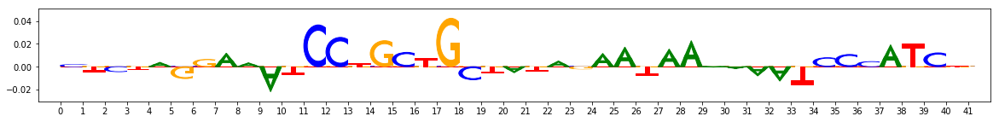

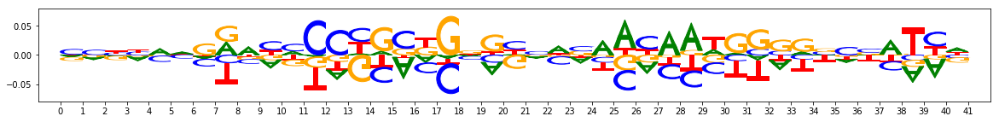

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.751460909843445


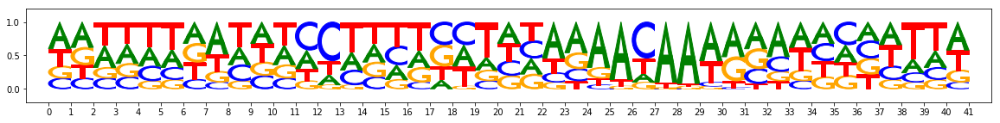

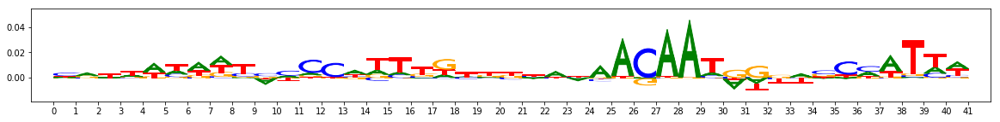

Round correlation 0.12204094969019305
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.554355025291443


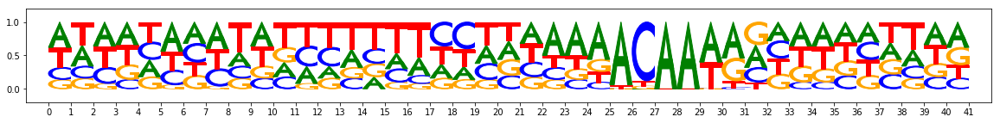

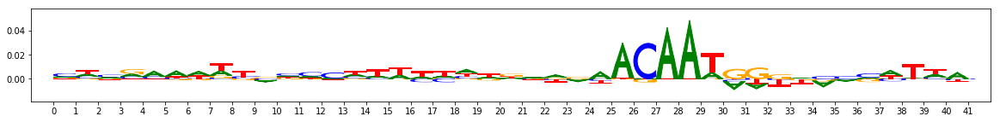

Round correlation 0.1438554423127084
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.464436411857605


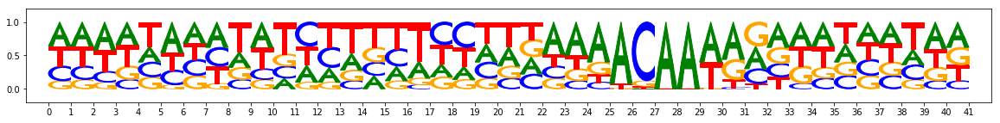

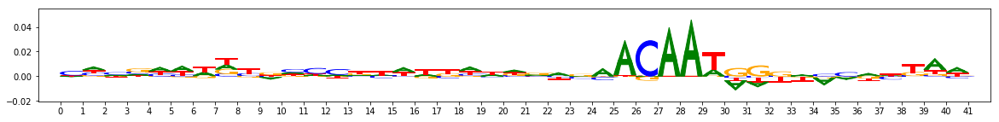

Round correlation 0.1644259526613031
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.423240423202515


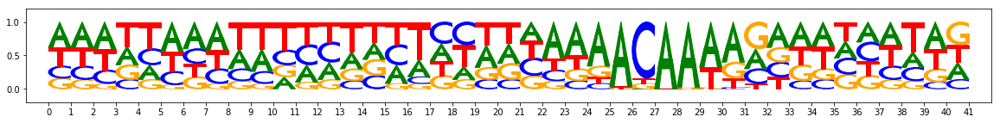

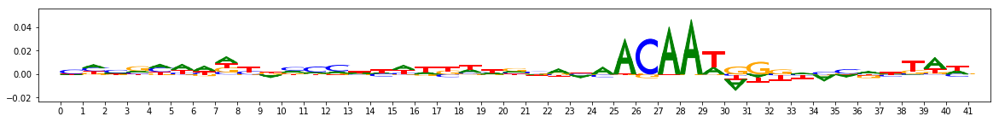

Round correlation 0.16885990589592903
#######################
FILTERING PERCENTILE: 80.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 8.718825697898865)
Coordinate:  example:80,start:527,end:568,rc:False
Contrib scores:


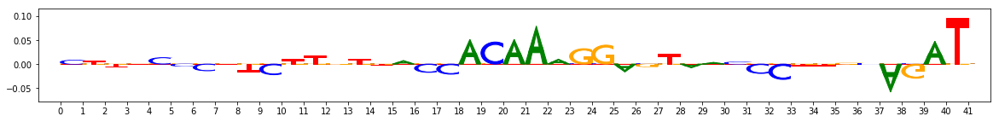

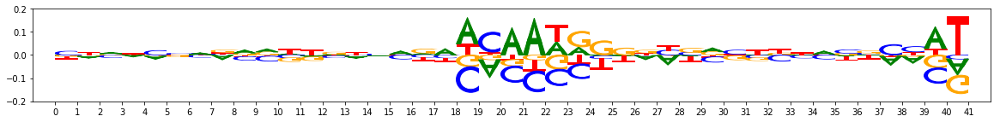

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.763149499893188


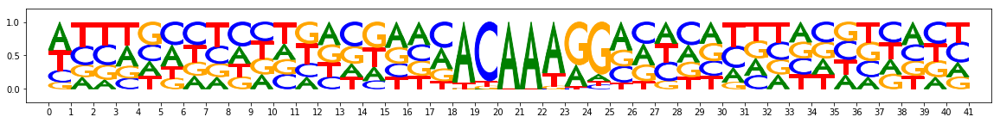

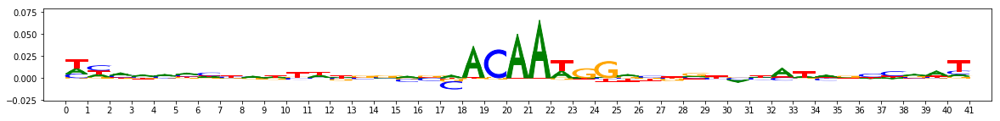

Round correlation 0.12075645878822099
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.999480366706848


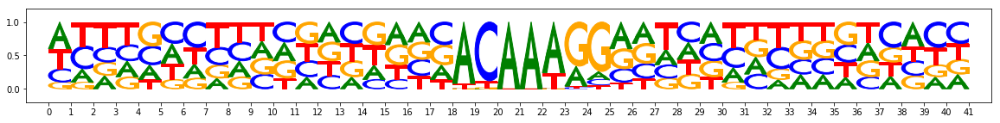

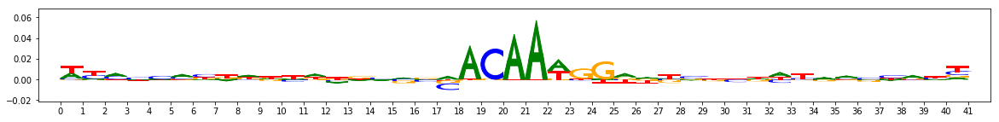

Round correlation 0.0978425553205201
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.787510573863983


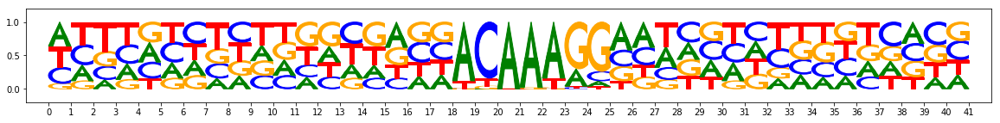

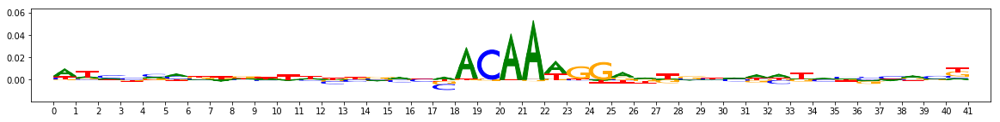

Round correlation 0.10352335362963556
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.718825697898865


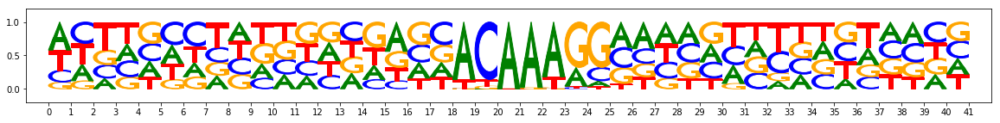

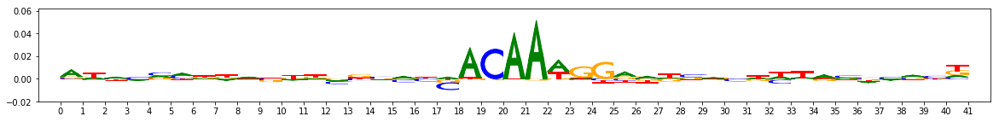

Round correlation 0.10791121577510042
#######################
FILTERING PERCENTILE: 85.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 9.01718658208847)
Coordinate:  example:273,start:609,end:650,rc:False
Contrib scores:


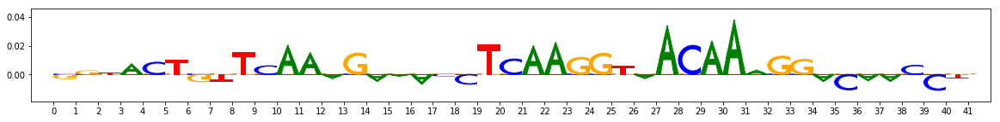

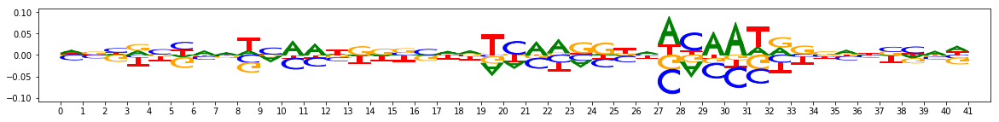

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.52033793926239


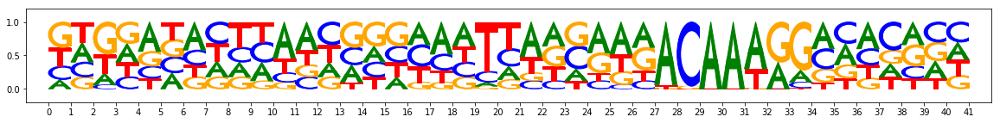

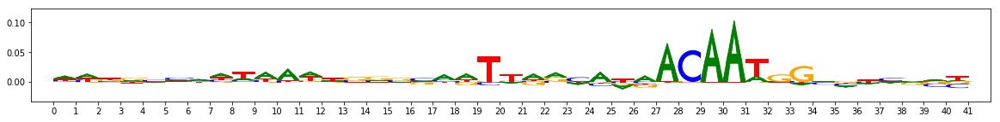

Round correlation 0.13926574275987652
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.582367539405823


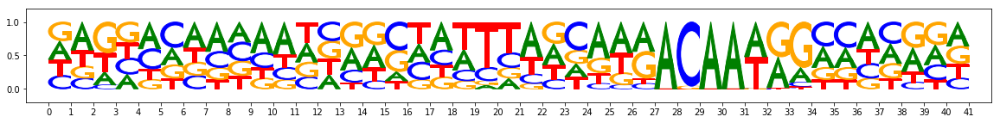

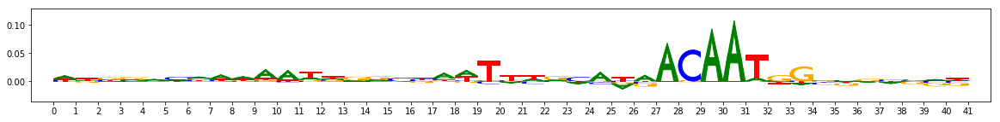

Round correlation 0.15739996081303442
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.330451011657715


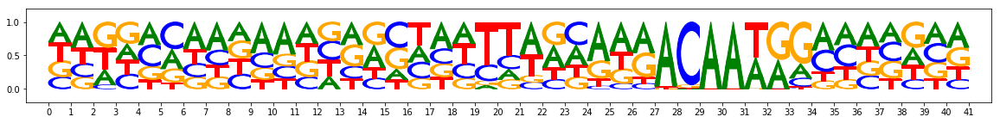

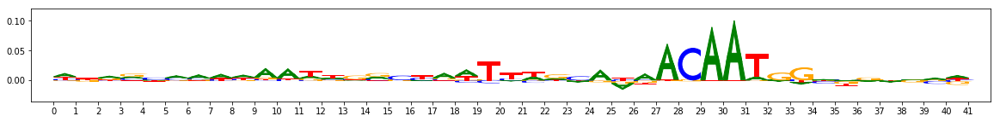

Round correlation 0.18271589528630144
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.01718658208847


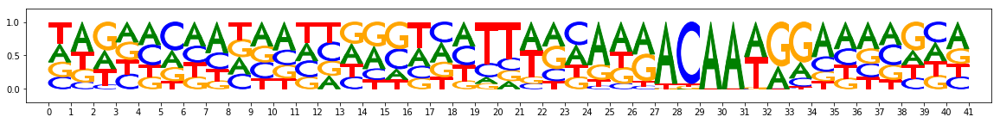

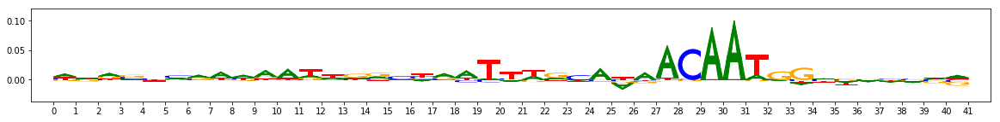

Round correlation 0.18403159062031144
#######################
FILTERING PERCENTILE: 90.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 9.284427165985107)
Coordinate:  example:290,start:630,end:671,rc:False
Contrib scores:


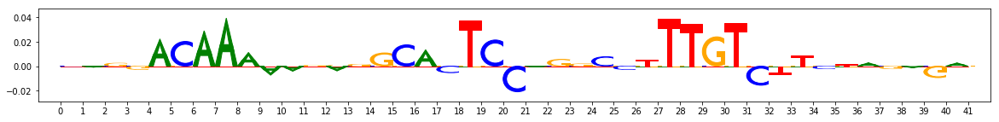

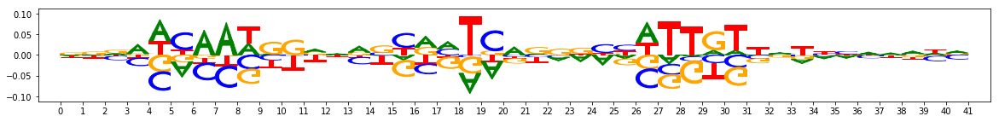

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.980462044477463


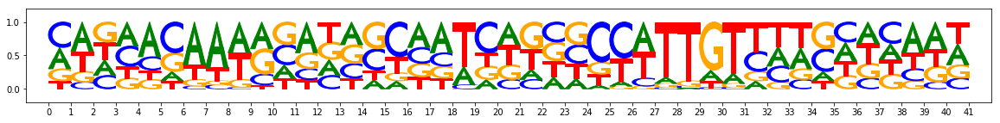

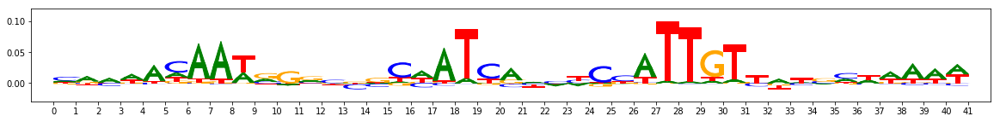

Round correlation 0.09067042660522674
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.405234456062317


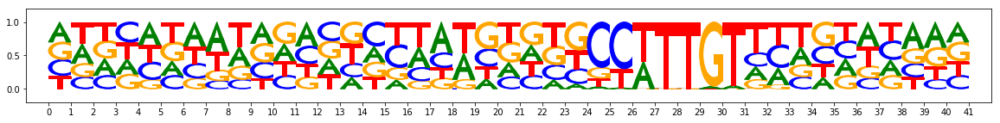

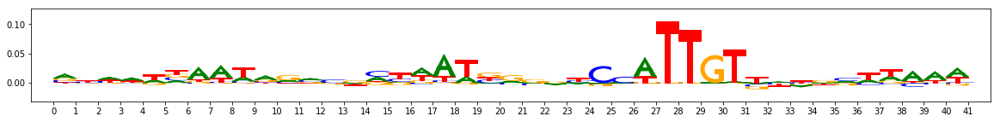

Round correlation 0.041172367381184405
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.51836621761322


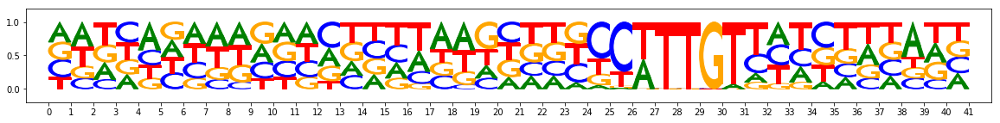

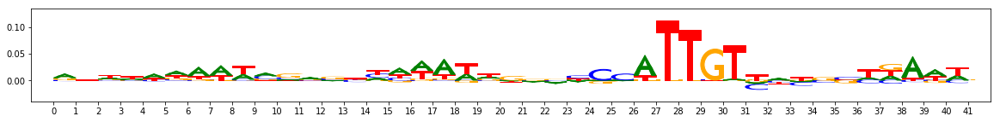

Round correlation 0.015644441322931642
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.284427165985107


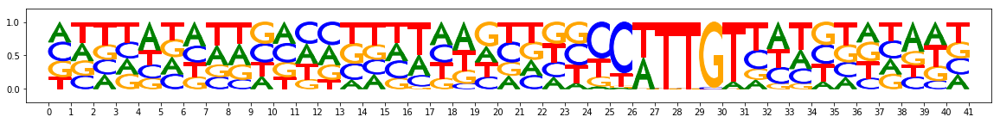

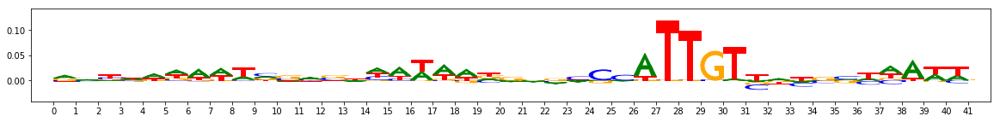

Round correlation -0.0005781425749116189
#######################
FILTERING PERCENTILE: 95.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 9.624182343482971)
Coordinate:  example:106,start:364,end:405,rc:False
Contrib scores:


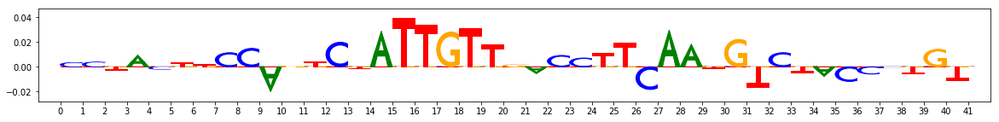

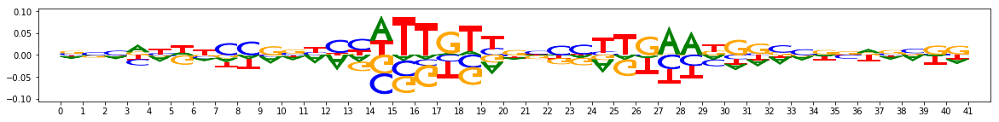

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.806995153427124


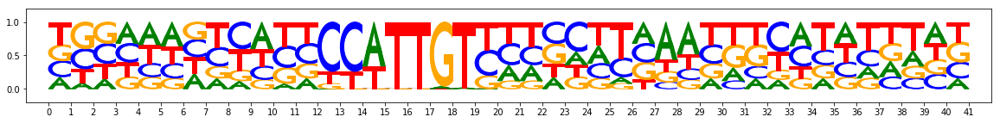

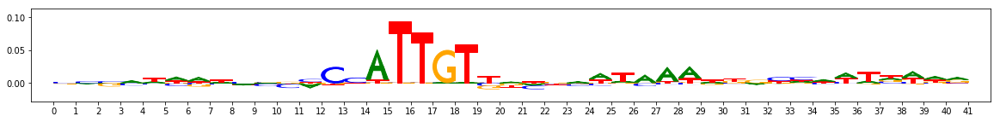

Round correlation 0.23789571566875423
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.077037811279297


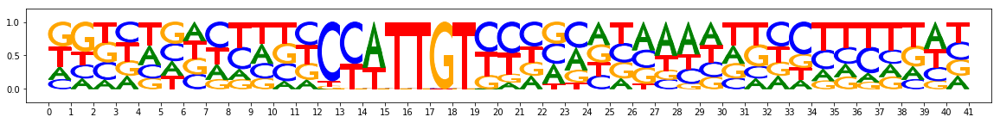

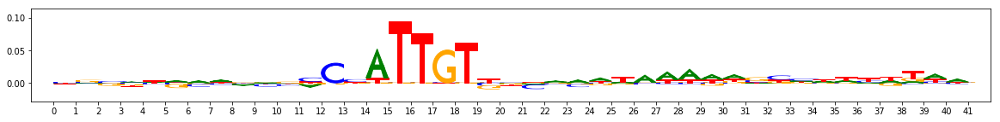

Round correlation 0.20353557293238403
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.690751194953918


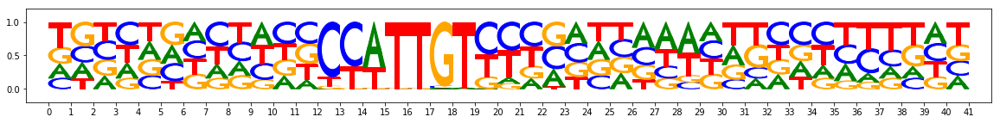

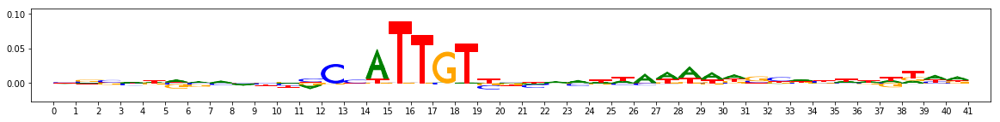

Round correlation 0.2037890262033805
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.624182343482971


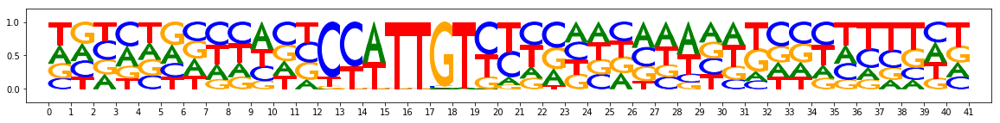

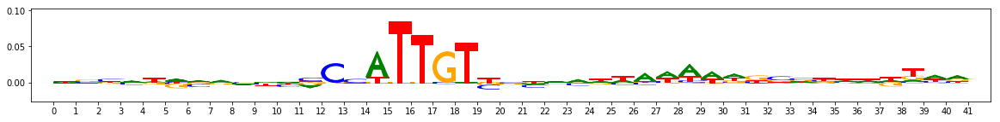

Round correlation 0.20886434207107019


In [83]:
ics_argsort = np.argsort(round_premotif_ics[-1])

def perpos_meannorm(arr):
    return arr - np.mean(arr, axis=-1)[:,None]

from modisco.visualization import viz_sequence
steps=20 #steps to visualize
for i in range(20):
    print("#######################\nFILTERING PERCENTILE:",100*i/steps)
    print("#######################")
    argsort_idx_lookup = i*int(len(seqlets)/steps)
    ics_idx = ics_argsort[argsort_idx_lookup]
    for seqlet_idx, rankingvals, idxtypename in [
        (ics_idx, round_premotif_ics[-1], "Last round Information Content of 50 NN PFM")]:
        print("-----------\nFiltered seqlet @ percentile, sorted via "+idxtypename+" (value: "+str(rankingvals[seqlet_idx])+")")
        print("Coordinate: ",seqlets[seqlet_idx].coor)
        print("Contrib scores:")
        viz_sequence.plot_weights(seqlets[seqlet_idx]["Nanog_profile_wn_contrib_scores"].fwd)
        viz_sequence.plot_weights(perpos_meannorm(seqlets[seqlet_idx]["Nanog_profile_wn_hypothetical_contribs"].fwd))
        for roundidx in range(len(round_premotif_ics)):
            print("Round",roundidx," PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC "
                  +str(round_premotif_ics[roundidx][seqlet_idx]))
            viz_sequence.plot_weights(round_premotif_avgseqlets[roundidx][seqlet_idx]["sequence"].fwd)
            viz_sequence.plot_weights(round_premotif_avgseqlets[roundidx][seqlet_idx]["Nanog_profile_wn_contrib_scores"].fwd)
            #viz_sequence.plot_weights(round_premotif_avgseqlets[roundidx][seqlet_idx]["Nanog_profile_wn_hypothetical_contribs"].fwd)
            print("Round correlation", round_correlations[roundidx][seqlet_idx])
    
#for i in premotif_ics_argsort[::int(len(seqlets)/50)]:
#    print(premotif_ics_argsort[i],
#          premotif_ics[premotif_ics_argsort[i]])
#    viz_sequence.plot_weights(
#        seqlets[premotif_ics_argsort[i]]
#               ["Nanog_profile_wn_contrib_scores"].fwd)

TSNE embedding for round 0
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 872 samples in 0.000s...
[t-SNE] Computed neighbors for 872 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 872 / 872
[t-SNE] Mean sigma: 0.497142
[t-SNE] Computed conditional probabilities in 0.038s
[t-SNE] Iteration 50: error = 69.4507751, gradient norm = 0.3310396 (50 iterations in 0.436s)
[t-SNE] Iteration 100: error = 69.3245621, gradient norm = 0.3204308 (50 iterations in 0.546s)
[t-SNE] Iteration 150: error = 70.3932266, gradient norm = 0.3026397 (50 iterations in 0.502s)
[t-SNE] Iteration 200: error = 70.7272339, gradient norm = 0.3116756 (50 iterations in 0.489s)
[t-SNE] Iteration 250: error = 69.5611877, gradient norm = 0.3018350 (50 iterations in 0.480s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.561188
[t-SNE] Iteration 300: error = 1.6524003, gradient norm = 0.0025470 (50 iterations in 0.465s)
[t-SNE] Iteration 350: error = 1.6244160, 

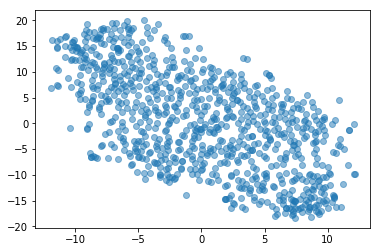

TSNE embedding for round 1
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 872 samples in 0.000s...
[t-SNE] Computed neighbors for 872 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 872 / 872
[t-SNE] Mean sigma: 0.495482
[t-SNE] Computed conditional probabilities in 0.036s
[t-SNE] Iteration 50: error = 67.9858704, gradient norm = 0.3153114 (50 iterations in 0.419s)
[t-SNE] Iteration 100: error = 67.2968597, gradient norm = 0.3105469 (50 iterations in 0.377s)
[t-SNE] Iteration 150: error = 67.5982132, gradient norm = 0.3208131 (50 iterations in 0.449s)
[t-SNE] Iteration 200: error = 68.2032471, gradient norm = 0.3167730 (50 iterations in 0.526s)
[t-SNE] Iteration 250: error = 68.4082413, gradient norm = 0.3258592 (50 iterations in 0.452s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.408241
[t-SNE] Iteration 300: error = 1.5662271, gradient norm = 0.0017596 (50 iterations in 0.345s)
[t-SNE] Iteration 350: error = 1.4956229, 

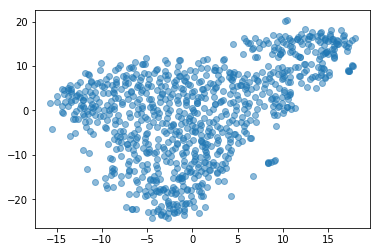

TSNE embedding for round 2
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 872 samples in 0.001s...
[t-SNE] Computed neighbors for 872 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 872 / 872
[t-SNE] Mean sigma: 0.556860
[t-SNE] Computed conditional probabilities in 0.034s
[t-SNE] Iteration 50: error = 67.3901978, gradient norm = 0.3295740 (50 iterations in 0.380s)
[t-SNE] Iteration 100: error = 67.2253952, gradient norm = 0.3129551 (50 iterations in 0.446s)
[t-SNE] Iteration 150: error = 67.0589294, gradient norm = 0.3122478 (50 iterations in 0.452s)
[t-SNE] Iteration 200: error = 67.0873795, gradient norm = 0.3342490 (50 iterations in 0.478s)
[t-SNE] Iteration 250: error = 67.4625244, gradient norm = 0.3114525 (50 iterations in 0.491s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.462524
[t-SNE] Iteration 300: error = 1.5707482, gradient norm = 0.0013204 (50 iterations in 0.445s)
[t-SNE] Iteration 350: error = 1.5074350, 

In [ ]:
from sklearn.manifold import TSNE
from matplotlib import pyplot as plt
from collections import Counter

tsne_perplexity = 10
aff_to_dist_mat = modisco.affinitymat.transformers.AffToDistViaInvLogistic()
density_adapted_affmat_transformer =(
            modisco.affinitymat.transformers.TsneConditionalProbs(                      
                    perplexity=tsne_perplexity,                                
                    aff_to_dist_mat=aff_to_dist_mat))
affmat_transformer = modisco.affinitymat.transformers.SymmetrizeByAddition(probability_normalize=True)
clusterer = modisco.cluster.core.LeidenCluster(                         
                affmat_transformer=affmat_transformer,                       
                contin_runs=50,
                n_leiden_iterations=-1,
                verbose=True)

round_embedding = []
subset_slice = slice(None,None,10)
for round_idx in range(len(round_sparse_nn_affmat_withargmax)):
    print("TSNE embedding for round", round_idx)
    dense_nn_affmat = reconstitute_dense_affmat(
                                        sparse_affmat_withargmax=round_sparse_nn_affmat_withargmax[round_idx],
                                        seqlet_neighbors=seqlet_neighbors)[subset_slice,subset_slice]
    dense_nn_distmat = aff_to_dist_mat(dense_nn_affmat)
    embedding = TSNE(verbose=2, perplexity=30, metric="precomputed",
                     random_state=1234).fit_transform(dense_nn_distmat)
    round_embedding.append(embedding)
    plt.gca().scatter(*zip(*embedding), alpha=0.5)
    plt.show()


round_to_cluster_results = {}
#run a tsne viz on the affinities.
for round_idx in range(len(round_sparse_nn_affmat_withargmax)):   
    dense_nn_affmat = reconstitute_dense_affmat(
                                        sparse_affmat_withargmax=round_sparse_nn_affmat_withargmax[round_idx],
                                        seqlet_neighbors=seqlet_neighbors)[subset_slice,subset_slice]
    dense_nn_distmat = aff_to_dist_mat(dense_nn_affmat)
    embedding = round_embedding[round_idx]
    round_embedding.append(embedding)
    
    cluster_results = clusterer(density_adapted_affmat_transformer(dense_nn_affmat),
                                initclusters=None)
    round_to_cluster_results[round_idx] = cluster_results
    plt.gca().scatter(*zip(*embedding), alpha=0.5, c=cluster_results.cluster_indices)
    plt.show()
    print(Counter(cluster_results.cluster_indices))

In [ ]:
from collections import defaultdict

initial_flank_to_add = 10
trim_to_window_size = 30
frac_support_to_trim_to = 0.2
min_num_to_trim_to = 7
expand_trim_expand1 = modisco.aggregator.ExpandSeqletsToFillPattern(                              
                track_set=track_set,                                            
                flank_to_add=initial_flank_to_add).chain(                  
            modisco.aggregator.TrimToBestWindow(                                        
                window_size=trim_to_window_size,                           
                track_names=contrib_scores_track_names)).chain(                 
            modisco.aggregator.ExpandSeqletsToFillPattern(                              
                track_set=track_set,                                            
                flank_to_add=initial_flank_to_add))
postprocessor1 = modisco.aggregator.TrimToFracSupport(                                       
                        min_frac=frac_support_to_trim_to,                  
                        min_num=min_num_to_trim_to,                        
                        verbose=True).chain(expand_trim_expand1)
seqlet_aggregator = modisco.aggregator.GreedySeqletAggregator(                  
            pattern_aligner=modisco.core.CrossContinJaccardPatternAligner(              
                pattern_comparison_settings=pattern_comparison_settings),       
                seqlet_sort_metric=                                             
                    lambda x: -sum([np.sum(np.abs(x[track_name].fwd)) for       
                               track_name in contrib_scores_track_names]),      
            postprocessor=postprocessor1)

def get_cluster_to_aggregate_motif(seqlets, cluster_indices, min_seqlets_in_motif):                   
    num_clusters = max(cluster_indices+1)
    cluster_to_seqlets = defaultdict(list)
    assert len(seqlets)==len(cluster_indices)
    for seqlet,idx in zip(seqlets, cluster_indices):
        cluster_to_seqlets[idx].append(seqlet)
    cluster_to_motif = OrderedDict()
    for i in range(num_clusters):
        if (len(cluster_to_seqlets[i]) >= min_seqlets_in_motif):
            print("Aggregating for cluster "+str(i)+" with "
                  +str(len(cluster_to_seqlets[i]))+" seqlets")
            sys.stdout.flush()
            motifs = seqlet_aggregator(cluster_to_seqlets[i])
            assert len(motifs)<=1
            if (len(motifs) > 0):
                motif = motifs[0]
                cluster_to_motif[i] = motif
    return cluster_to_motif

for round_idx in range(len(round_embedding)):
    print("ROUND IDX", round_idx)
    cluster_results = round_to_cluster_results[round_idx]
    embedding = round_embedding[round_idx]
    cluster_to_motif = get_cluster_to_aggregate_motif(
        seqlets=seqlets[::10],
        cluster_indices=cluster_results.cluster_indices,
        min_seqlets_in_motif=min_num_to_trim_to)
    for idx in sorted(cluster_to_motif.keys()):
        print("cluster idx",idx)
        plt.scatter(*zip(*embedding[cluster_results.cluster_indices==idx]),
                    color="red")
        plt.scatter(*zip(*embedding[cluster_results.cluster_indices!=idx]),
                    color="blue")
        plt.show()
        viz_sequence.plot_weights(cluster_to_motif[idx]["Nanog_profile_wn_contrib_scores"].fwd)
        viz_sequence.plot_weights(cluster_to_motif[idx]["sequence"].fwd)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8719 samples in 0.051s...
[t-SNE] Computed neighbors for 8719 samples in 0.819s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8719
[t-SNE] Computed conditional probabilities for sample 2000 / 8719
[t-SNE] Computed conditional probabilities for sample 3000 / 8719
[t-SNE] Computed conditional probabilities for sample 4000 / 8719
[t-SNE] Computed conditional probabilities for sample 5000 / 8719
[t-SNE] Computed conditional probabilities for sample 6000 / 8719
[t-SNE] Computed conditional probabilities for sample 7000 / 8719
[t-SNE] Computed conditional probabilities for sample 8000 / 8719
[t-SNE] Computed conditional probabilities for sample 8719 / 8719
[t-SNE] Mean sigma: 0.318136
[t-SNE] Computed conditional probabilities in 0.358s
[t-SNE] Iteration 50: error = 92.5316010, gradient norm = 0.0000064 (50 iterations in 3.768s)
[t-SNE] Iteration 100: error = 92.3685989, gradient norm = 0.0061796 (50 iterations in 4.

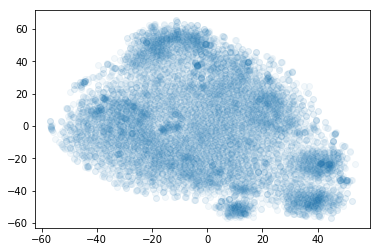

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8719 samples in 0.061s...
[t-SNE] Computed neighbors for 8719 samples in 0.775s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8719
[t-SNE] Computed conditional probabilities for sample 2000 / 8719
[t-SNE] Computed conditional probabilities for sample 3000 / 8719
[t-SNE] Computed conditional probabilities for sample 4000 / 8719
[t-SNE] Computed conditional probabilities for sample 5000 / 8719
[t-SNE] Computed conditional probabilities for sample 6000 / 8719
[t-SNE] Computed conditional probabilities for sample 7000 / 8719
[t-SNE] Computed conditional probabilities for sample 8000 / 8719
[t-SNE] Computed conditional probabilities for sample 8719 / 8719
[t-SNE] Mean sigma: 0.267740
[t-SNE] Computed conditional probabilities in 0.375s
[t-SNE] Iteration 50: error = 92.8614655, gradient norm = 0.0029600 (50 iterations in 5.521s)
[t-SNE] Iteration 100: error = 88.0847168, gradient norm = 0.0012540 (50 iterations in 8.

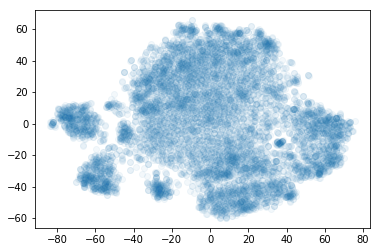

In [68]:
#run a tsne viz on the affinities.
usingpremotifsround1_dense_nn_affmat = reconstitute_dense_affmat(
                                    sparse_affmat_withargmax=usingpremotifsround1_sparse_nn_affmat_withargmax,
                                    seqlet_neighbors=seqlet_neighbors)
dense_nn_distmat = aff_to_dist_mat(usingpremotifsround1_dense_nn_affmat)
usingpremotifsround1_dense_nn_distmat_embedding = TSNE(verbose=2, perplexity=30, metric="precomputed").fit_transform(dense_nn_distmat)

from matplotlib import pyplot as plt
plt.scatter(*zip(*usingpremotifsround1_dense_nn_distmat_embedding), alpha=0.05)
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8719 samples in 0.054s...
[t-SNE] Computed neighbors for 8719 samples in 0.751s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8719
[t-SNE] Computed conditional probabilities for sample 2000 / 8719
[t-SNE] Computed conditional probabilities for sample 3000 / 8719
[t-SNE] Computed conditional probabilities for sample 4000 / 8719
[t-SNE] Computed conditional probabilities for sample 5000 / 8719
[t-SNE] Computed conditional probabilities for sample 6000 / 8719
[t-SNE] Computed conditional probabilities for sample 7000 / 8719
[t-SNE] Computed conditional probabilities for sample 8000 / 8719
[t-SNE] Computed conditional probabilities for sample 8719 / 8719
[t-SNE] Mean sigma: 0.269850
[t-SNE] Computed conditional probabilities in 0.355s
[t-SNE] Iteration 50: error = 93.4284744, gradient norm = 0.0033141 (50 iterations in 5.866s)
[t-SNE] Iteration 100: error = 85.0929337, gradient norm = 0.0017714 (50 iterations in 6.

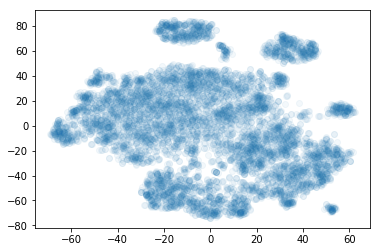

In [69]:
#run a tsne viz on the affinities.
usingpremotifsround2_dense_nn_affmat = reconstitute_dense_affmat(
                                    sparse_affmat_withargmax=usingpremotifsround2_sparse_nn_affmat_withargmax,
                                    seqlet_neighbors=seqlet_neighbors)
dense_nn_distmat = aff_to_dist_mat(usingpremotifsround2_dense_nn_affmat)
usingpremotifsround2_dense_nn_distmat_embedding = TSNE(verbose=2, perplexity=30, metric="precomputed").fit_transform(dense_nn_distmat)

from matplotlib import pyplot as plt
plt.scatter(*zip(*usingpremotifsround2_dense_nn_distmat_embedding), alpha=0.05)
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8719 samples in 0.050s...
[t-SNE] Computed neighbors for 8719 samples in 0.743s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8719
[t-SNE] Computed conditional probabilities for sample 2000 / 8719
[t-SNE] Computed conditional probabilities for sample 3000 / 8719
[t-SNE] Computed conditional probabilities for sample 4000 / 8719
[t-SNE] Computed conditional probabilities for sample 5000 / 8719
[t-SNE] Computed conditional probabilities for sample 6000 / 8719
[t-SNE] Computed conditional probabilities for sample 7000 / 8719
[t-SNE] Computed conditional probabilities for sample 8000 / 8719
[t-SNE] Computed conditional probabilities for sample 8719 / 8719
[t-SNE] Mean sigma: 0.272174
[t-SNE] Computed conditional probabilities in 0.358s
[t-SNE] Iteration 50: error = 93.1927185, gradient norm = 0.0113080 (50 iterations in 4.070s)
[t-SNE] Iteration 100: error = 83.0941315, gradient norm = 0.0022359 (50 iterations in 3.

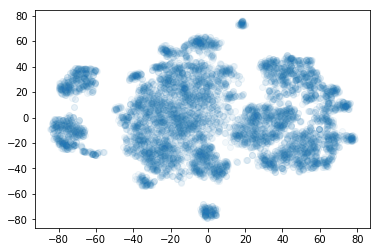

In [66]:
#run a tsne viz on the affinities.
usingpremotifsround3_dense_nn_affmat = reconstitute_dense_affmat(
                                    sparse_affmat_withargmax=usingpremotifsround3_sparse_nn_affmat_withargmax,
                                    seqlet_neighbors=seqlet_neighbors)
dense_nn_distmat = aff_to_dist_mat(usingpremotifsround3_dense_nn_affmat)

usingpremotifsround3_dense_nn_distmat_embedding = TSNE(verbose=2, perplexity=30, metric="precomputed").fit_transform(dense_nn_distmat)

from matplotlib import pyplot as plt
plt.scatter(*zip(*usingpremotifsround3_dense_nn_distmat_embedding), alpha=0.05)
plt.show()